In [1]:
#Run this cell to upgrade your matplotlib to the latest version
#!pip install matplotlib --upgrade

# Importing Necessary Libraries & Packages

In [2]:
import numpy as np
import pandas as pd

import glob, random, os, warnings
import matplotlib.pyplot as plt
from datetime import datetime
from tqdm import tqdm
import seaborn as sns
from time import time
import time as t
import shutil
import cv2

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay


import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.layers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#To get the same results in different environments
def seed_everything(seed = 0):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = "True"
    os.environ["TF_DISABLE_SEGMENT_REDUCTION_OP_DETERMINISM_EXCEPTIONS"] = "True"

seed_everything()
warnings.filterwarnings('ignore')


print('TensorFlow Version ' + tf.__version__)

TensorFlow Version 2.16.1


In [3]:
image_size = 224
batch_size = 32
n_classes = 2
learning_rate = 0.001
weight_decay = 0.0001
num_epochs = 40

mlp_rate = 2
patch_size = 16  # Size of the patches to be used while extracting them from images
num_patches = (image_size // patch_size) ** 2
projection_dim = 64
num_heads = 4
transformer_units = [
    projection_dim * 2,
    projection_dim,
]  # Size of the transformer layers
transformer_layers = 8

In [4]:
# class_to_label_map = {'pneumonia' : 2, 'covid' : 1, 'normal' : 0}

In [3]:
import os
import pandas as pd

# Define the dataset path and the simplified class labels
data_dir = 'Dataset/Train'
class_to_label_map = {'Neutral': 0, 'Gore': 1, 'Nudity': 1, 'Substances': 1, 'Violence': 1}

# Initialize an empty list to store the data
data = []

# Populate the list by iterating over the directories in the class-to-label map
for label, class_num in class_to_label_map.items():
    class_dir = os.path.join(data_dir, label)
    if os.path.exists(class_dir):  # Check if the directory exists
        for filename in os.listdir(class_dir):
            if filename.endswith(('.png', '.jpg', '.jpeg')):  # Ensure only images are processed
                file_path = os.path.join(label, filename)
                data.append({'class': label, 'directory': file_path, 'label': class_num})

# Create the DataFrame from the list
df = pd.DataFrame(data)

# Shuffle the DataFrame for randomness
df = df.sample(frac=1, random_state=4).reset_index(drop=True)

print(df.head())


        class                                          directory  label
0      Nudity  Nudity\FFB9FAA5-C876-452D-80CF-ADBB79CE7AD6_jp...      1
1  Substances  Substances\cocaine_image07-19-_jpg.rf.31052d29...      1
2        Gore  Gore\0_w_bloodstains_24_jpg.rf.729e35a31f4d5b1...      1
3     Neutral                             Neutral\fruit_0574.jpg      0
4     Neutral                               Neutral\dog_0678.jpg      0


In [4]:
df

,class,directory,label
0,Nudity,Nudity\FFB9FAA5-C876-452D-80CF-ADBB79CE7AD6_jp...,1
1,Substances,Substances\cocaine_image07-19-_jpg.rf.31052d29...,1
2,Gore,Gore\0_w_bloodstains_24_jpg.rf.729e35a31f4d5b1...,1
3,Neutral,Neutral\fruit_0574.jpg,0
4,Neutral,Neutral\dog_0678.jpg,0
...,...,...,...
27726,Substances,Substances\marijuanna_image48_jpg.rf.13bed6b50...,1
27727,Nudity,Nudity\GantMan_CF1A41E2-91F6-43DA-94C8-FBB587D...,1
27728,Violence,Violence\images-2023-10-03T123436-705_jpg.rf.9...,1
27729,Neutral,Neutral\fruit_0161.jpg,0


# **E**xploratory **D**ata **A**nalysis

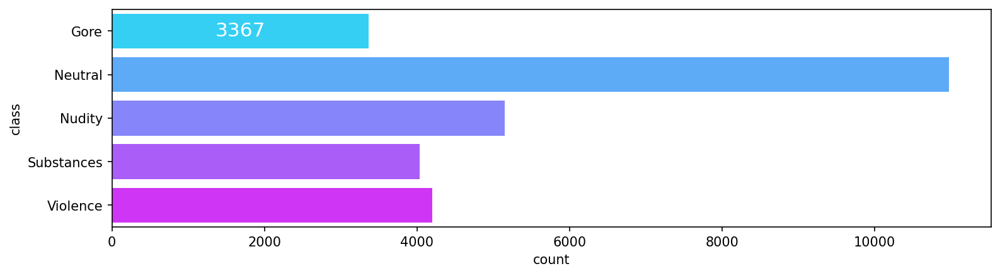

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style and DPI for high-quality visuals
plt.rcParams['figure.dpi'] = 150
plt.style.use('tableau-colorblind10')

# Create the plot
plt.figure(figsize=(12, 3))
splot = sns.countplot(data=df, y='class', order=sorted(df['class'].unique()), palette='cool', saturation=0.9)

# Check if containers are available before labeling
if splot.containers:
    # Automatically label each bar with its height (count value)
    plt.bar_label(splot.containers[0], label_type='center', size=15, color='w')

plt.show()


<Axes: ylabel='count'>

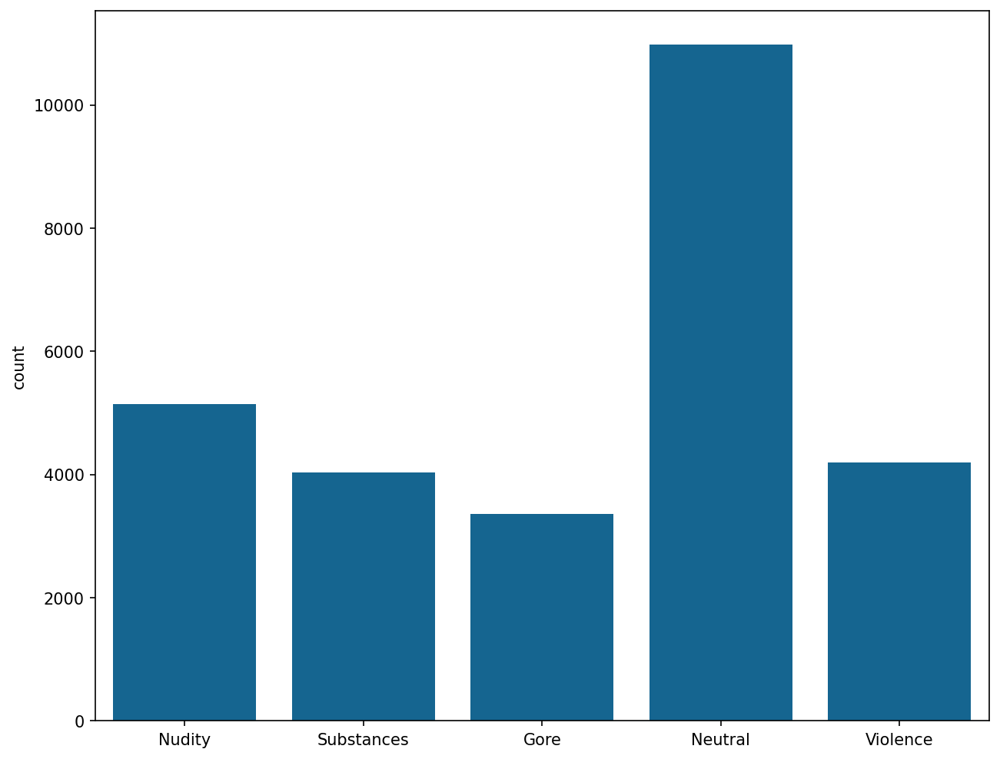

In [6]:
labels = df['class'].values
plt.figure(figsize = (10,8))
sns.countplot(x =labels)

In [9]:
# plt.figure()
# image = cv2.imread("/kaggle/input/covid19-chest-xray-dataset/covid19-pneumonia-normal-chest-xraypa-dataset/COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/covid/03BF7561-A9BA-4C3C-B8A0-D3E585F73F3C-1068x1083.jpeg")
# plt.imshow(image)
# plt.axis('off')
# plt.show()

# print('Image Shape: {}'.format(image.shape))
# print('Image Height: {}'.format(image.shape[0]))
# print('Image Width: {}'.format(image.shape[1]))
# print('Image Dimension: {}'.format(image.ndim))
# print('Image Size: {}kb'.format(image.size//1024))
# print('Image Data Type: {}'.format(image.dtype))
# print('Maximum RGB value of the image: {}'.format(image.max()))
# print('Minimum RGB value of the image: {}'.format(image.min()))



* **Train set --> 80%**
* **Test set --> 20%**

In [19]:
from sklearn.model_selection import train_test_split

# First, split into training + validation and test sets
X_train_val, X_test, Y_train_val, Y_test = train_test_split(
    df['directory'], df['class'], stratify=df['class'], test_size=0.20, random_state=1
)

# Then, split the training + validation set into separate training and validation sets
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train_val, Y_train_val, stratify=Y_train_val, test_size=0.25, random_state=1
)

# This results in:
# - 20% of the data as the test set
# - 20% of the data as the validation set (25% of the remaining 80% training set)
# - 60% of the data as the training set

# Check the distribution
print("Training set size:", len(X_train))
print("Validation set size:", len(X_val))
print("Test set size:", len(X_test))


Training set size: 16638
Validation set size: 5546
Test set size: 5547


In [20]:
print(f"""
{'-'*40}
# Train samples: {Y_train.shape}
# Test samples: {Y_test.shape}
# Val samples: {Y_val.shape}
{'-'*40}
""")


----------------------------------------
# Train samples: (16638,)
# Test samples: (5547,)
# Val samples: (5546,)
----------------------------------------



In [9]:
import os
import shutil

def copy_images(df, directory):
    input_path = "Dataset/Train"
    output_path = "out/" + directory

    # Remove any old files in the output path
    if os.path.exists(output_path):
        shutil.rmtree(output_path)

    # Create main folders inside output path
    os.makedirs(output_path, exist_ok=True)
    os.makedirs(os.path.join(output_path, 'Neutral'), exist_ok=True)
    os.makedirs(os.path.join(output_path, 'NSFW'), exist_ok=True)

    # Copy images based on class mapping
    for _, row in df.iterrows():
        # Determine the target folder (Neutral or NSFW)
        if row['class'] == 'Neutral':
            target_folder = 'Neutral'
        else:
            target_folder = 'NSFW'

        # Define the source and destination paths
        path_from = os.path.join(input_path, row['directory'])
        path_to = os.path.join(output_path, target_folder, os.path.basename(row['directory']))
        
        # Copy the file from source to destination
        shutil.copy(path_from, path_to)



In [21]:
# Combine X and Y splits to create DataFrames for each subset
df_test = pd.concat([X_test, Y_test], axis=1)
df_train = pd.concat([X_train, Y_train], axis=1)
df_val = pd.concat([X_val, Y_val], axis=1)

# Copy images to respective folders
copy_images(df_test, 'test')
copy_images(df_train, 'train')
copy_images(df_val, 'val')


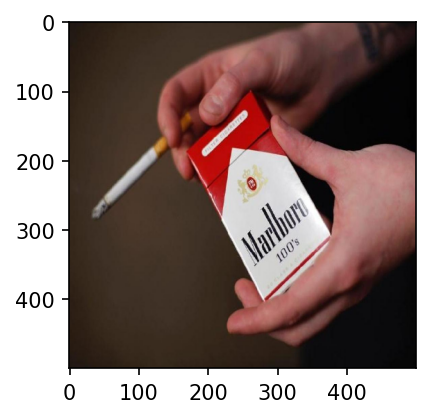

In [11]:
image_path = r'Dataset\Train\Substances\0e0a97107df73c66543bccc5b0927abf_60ffa0bae17d0_jpg.rf.688c078d15716729e3f9ef0e0bc45116.jpg'
#Loads image in from the set image path
img = tf.keras.preprocessing.image.load_img(image_path, target_size= (500,500))
img_tensor = tf.keras.preprocessing.image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
#Allows us to properly visualize our image by rescaling values in array
img_tensor /= 255.
#Plots image
plt.figure(figsize=(3,3))
plt.imshow(img_tensor[0])
plt.show()

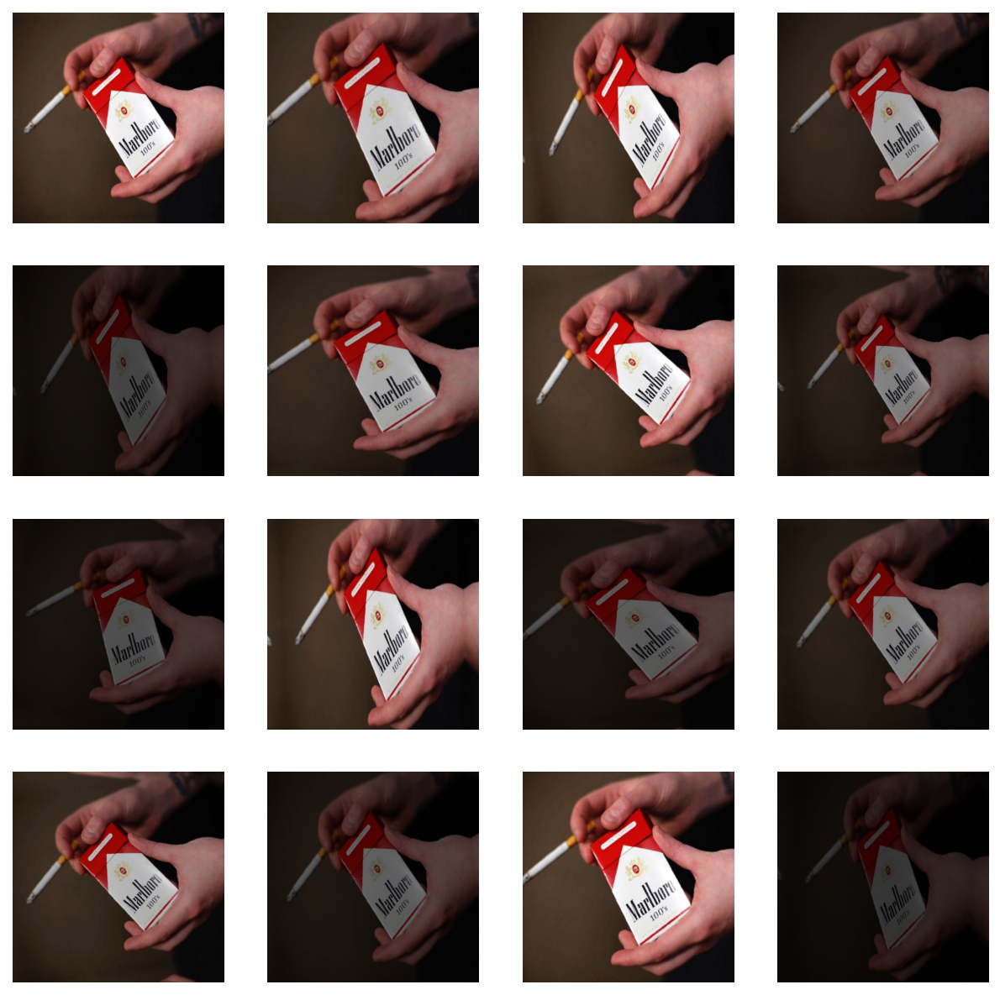

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    shear_range=0.25,
    zoom_range=0.2,
    rotation_range=15,
    brightness_range=[0.15, 1.15],
    width_shift_range=[-2, -1, 0, 1, 2],
    height_shift_range=[-1, 0, 1],
    fill_mode='reflect'
)

# Creates our batch of one image
pic = datagen.flow(img_tensor * 255, batch_size=1)

# Plot our figures
plt.figure(figsize=(10, 10))
for i in range(1, 17):
    plt.subplot(4, 4, i)
    batch = next(pic)  # Use next(pic) instead of pic.next()
    image_ = batch[0].astype('uint8')
    plt.imshow(image_)
    plt.axis('off')
plt.show()


In [42]:
# test_path = r'out\test'
# train_path = r'out\train'

# #Data augmentation methods are applied here!
# datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,
#                                                             validation_split = 0.2,
#                                                             featurewise_center = "True",
#                                                             featurewise_std_normalization = "True",
#                                                             shear_range = 0.25,
#                                                             zoom_range = 0.2,
#                                                             rotation_range = 15,
#                                                             brightness_range = [0.15, 1.15],
#                                                             width_shift_range = [-2,-1, 0, +1, +2],
#                                                             height_shift_range = [ -1, 0, +1],
#                                                             fill_mode = 'reflect')

# #Different generator
# test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

# train_gen = datagen.flow_from_dataframe(dataframe = df_train,
#                                         directory = train_path,
#                                         x_col = 'directory',
#                                         y_col = 'class',
#                                         subset = 'training',
#                                         batch_size = batch_size,
#                                         seed = 1,
#                                         color_mode = 'grayscale',
#                                         shuffle = True,
#                                         class_mode = 'categorical',
#                                         target_size = (image_size, image_size))

# valid_gen = datagen.flow_from_dataframe(dataframe = df_train,
#                                         directory = train_path,
#                                         x_col = 'directory',
#                                         y_col = 'class',
#                                         subset = 'validation',
#                                         batch_size = batch_size,
#                                         seed = 1,
#                                         color_mode = 'grayscale',
#                                         shuffle = True,
#                                         class_mode = 'categorical',
#                                         target_size = (image_size, image_size))


# test_gen = test_datagen.flow_from_directory(
#     directory=test_path,
#     color_mode="grayscale",
#     batch_size=1,
#     class_mode=None,
#     shuffle=False,
#     seed=1,
#     target_size = (image_size, image_size)
# )

In [22]:
# Paths for train, validation, and test directories
train_path = r'out/train'
val_path = r'out/val'
test_path = r'out/test'

# Data augmentation for the training set
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    featurewise_center=True,
    featurewise_std_normalization=True,
    shear_range=0.25,
    zoom_range=0.2,
    rotation_range=15,
    brightness_range=[0.15, 1.15],
    width_shift_range=[-2, -1, 0, +1, +2],
    height_shift_range=[-1, 0, +1],
    fill_mode='reflect'
)

# Simple rescaling for the validation set (no augmentation)
val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

# Training generator
train_gen = train_datagen.flow_from_directory(
    directory=train_path,
    color_mode='grayscale',
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=1
)

# Validation generator
valid_gen = val_datagen.flow_from_directory(
    directory=val_path,
    color_mode='grayscale',
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=1
)

# Test generator remains the same
test_gen = test_datagen.flow_from_directory(
    directory=test_path,
    color_mode="grayscale",
    batch_size=1,
    class_mode=None,
    shuffle=False,
    seed=1,
    target_size=(image_size, image_size)
)

# Calculate steps per epoch to use 50% of each dataset
num_train_images = int(0.5 * train_gen.samples)
num_val_images = int(0.5 * valid_gen.samples)
num_test_images = int(0.5 * len(test_gen.filenames))

train_steps = num_train_images // batch_size
val_steps = num_val_images // batch_size
test_steps = num_test_images


Found 16638 images belonging to 2 classes.
Found 5546 images belonging to 2 classes.
Found 5547 images belonging to 2 classes.


# **Model 1 - Vision Transformer from Scratch**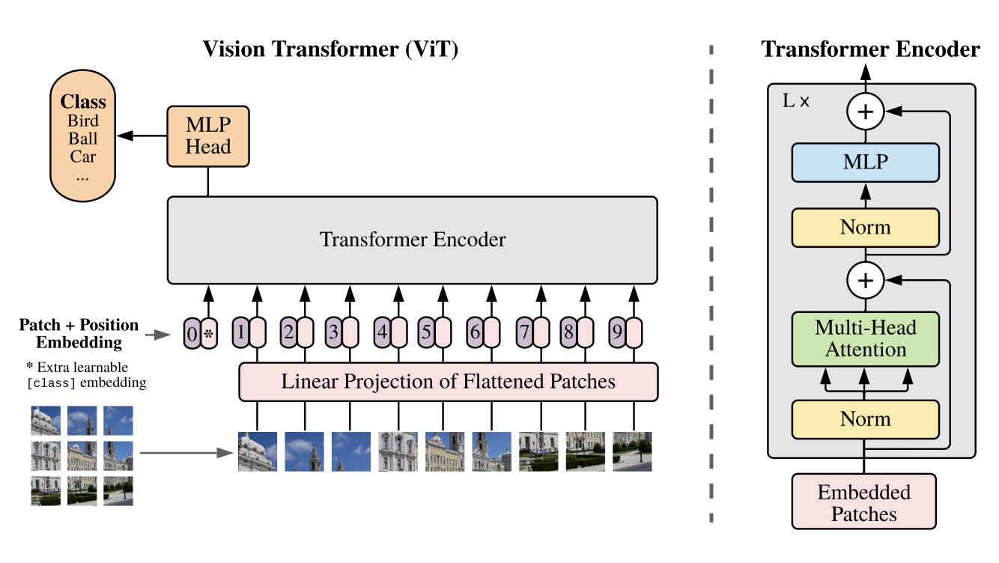

In [23]:
class PatchEmbedding(tf.keras.layers.Layer):
    def __init__(self , size , num_of_patches , projection_dim):
        super().__init__()

        self.size=size
        self.num_of_patches= num_of_patches + 1
        self.projection_dim=projection_dim

        self.projection=tf.keras.layers.Dense(projection_dim)

        self.clsToken= tf.Variable(tf.keras.initializers.GlorotNormal()(shape=(1 , 1 , projection_dim)) , trainable=True)
        #create vector for each patch
        self.positionalEmbedding = tf.keras.layers.Embedding(self.num_of_patches , projection_dim)


    def call(self, inputs):
        patches = tf.image.extract_patches(inputs , sizes=[1 , self.size , self.size , 1], strides=[1 , self.size , self.size , 1], rates=[1 ,1 ,1 ,1], padding="VALID",)
        patches=tf.reshape(patches, (tf.shape(inputs)[0], -1, self.size * self.size *1))
        patches= self.projection(patches)

        # repeat cls token length of batch size
        clsToken = tf.repeat(self.clsToken , tf.shape(inputs)[0] , 0)
        patches = tf.concat((clsToken, patches) , axis=1)
        # create position number for each patch
        positions = tf.range(0 , self.num_of_patches , 1)[tf.newaxis , ...]
        positionalEmbedding = self.positionalEmbedding(positions)

        #print(positionalEmbedding)
        patches= patches + positionalEmbedding
        return patches

Let's plot the patches for a simpler case (In the model training, there are way more patches!)

Image size: 224 X 224
Patch size: 128 X 128
Patches per image: 25
Elements per patch: 49152


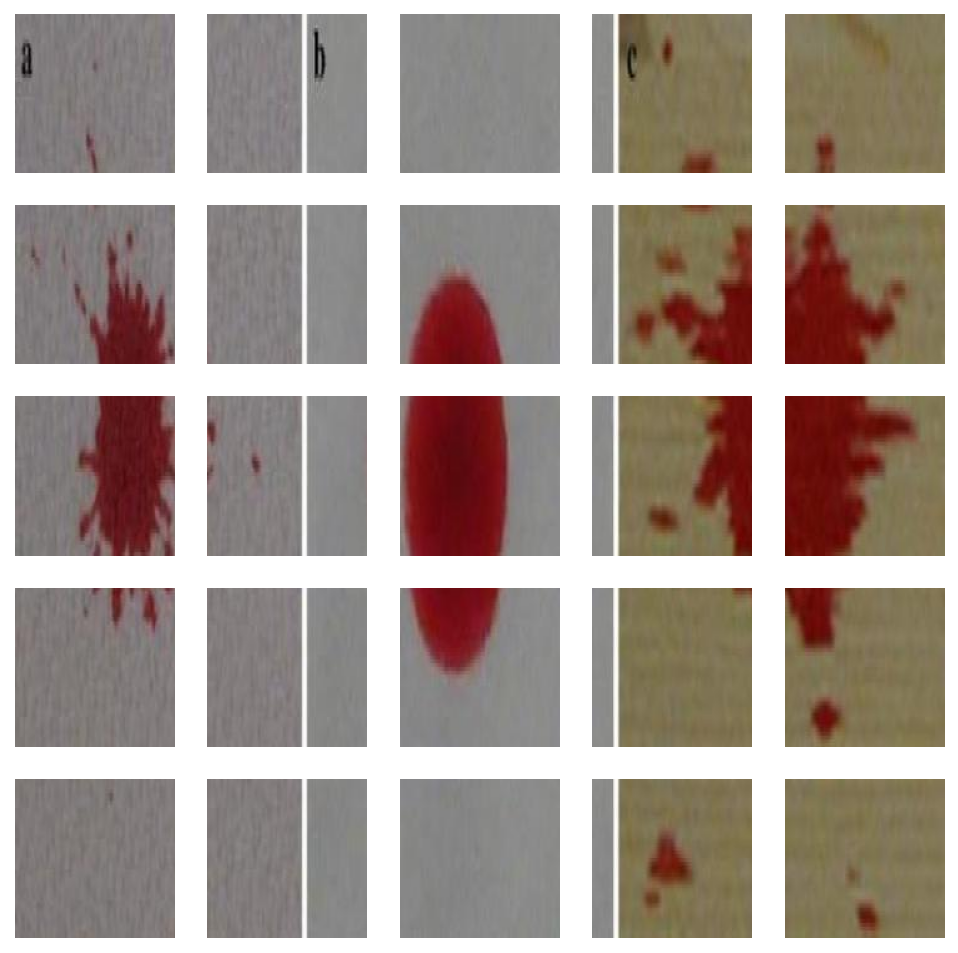

In [26]:
def patch_plot(input_path):

    patch_size = 128
    image_path = input_path
    image = tf.keras.preprocessing.image.load_img(image_path)
    imageArray=tf.keras.preprocessing.image.img_to_array(image)
    imageArray = imageArray[tf.newaxis , ...]
    patches= tf.image.extract_patches(imageArray, sizes=[1 , patch_size , patch_size ,1], strides=[1 , patch_size ,patch_size , 1] , rates=[1,1,1,1], padding="VALID" )
    patches=tf.reshape(patches , shape=(tf.shape(patches)[0] , -1 , patch_size*patch_size*3))
    image_array = tf.keras.preprocessing.image.img_to_array(image)


    resized_image = tf.image.resize(
        tf.convert_to_tensor([image_array]), size=(image_size, image_size)
    )

    print(f"Image size: {image_size} X {image_size}")
    print(f"Patch size: {patch_size} X {patch_size}")
    print(f"Patches per image: {patches.shape[1]}")
    print(f"Elements per patch: {patches.shape[-1]}")

    n = int(np.sqrt(patches.shape[1]))
    plt.figure(figsize=(8, 8))
    for i, patch in enumerate(patches[0]):
        ax = plt.subplot(n, n, i + 1)
        patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
        plt.imshow(patch_img.numpy().astype("uint8"))
        plt.axis("off")
    #plt.savefig('patches.png', dpi=1200)
patch_plot(r'out\train\NSFW\0_w_bloodstain-accident_81_jpg.rf.e3073f284ce2e7def6430772b76f81a1.jpg')

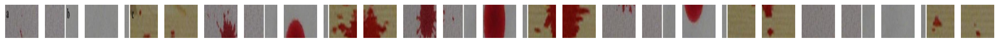

In [28]:
patch_size_2 = 128
image_path = r'out\train\NSFW\0_w_bloodstain-accident_81_jpg.rf.e3073f284ce2e7def6430772b76f81a1.jpg'
image = tf.keras.preprocessing.image.load_img(image_path)
imageArray=tf.keras.preprocessing.image.img_to_array(image)
imageArray = imageArray[tf.newaxis , ...]
patches= tf.image.extract_patches(imageArray, sizes=[1 , patch_size_2 , patch_size_2 ,1], strides=[1 , patch_size_2 ,patch_size_2 , 1] , rates=[1,1,1,1], padding="VALID" )
patches=tf.reshape(patches , shape=(tf.shape(patches)[0] , -1 , patch_size_2*patch_size_2*3))


n = int(np.sqrt(patches.shape[1]))
plt.figure(figsize=(n *n , 1))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(1 ,n*n , i + 1)
    patch_img = tf.reshape(patch, (128, 128, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")
#plt.savefig('patches_flat.png', dpi=600)

## Transformer Encoder

In [29]:
class TransformerLayer(tf.keras.layers.Layer):
    def __init__(self , d_model , heads , mlp_rate , dropout_rate=0.1):
        super().__init__()

        self.layernorm_1 = LayerNormalization(epsilon=1e-6)
        self.mha= tf.keras.layers.MultiHeadAttention(heads, d_model//heads , dropout=dropout_rate)

        self.layernorm_2 = LayerNormalization(epsilon=1e-6)
        self.mlp = tf.keras.Sequential([
                                        Dense(d_model * mlp_rate , activation="gelu"),
                                        Dropout(dropout_rate),
                                        Dense(d_model , activation="gelu"),
                                        Dropout(dropout_rate)
        ])
    def call(self , inputs , training=True):
        out_1 = self.layernorm_1(inputs)
        out_1 = self.mha(out_1 , out_1 ,training=training)
        out_1 = inputs + out_1

        out_2= self.layernorm_2(out_1)
        out_2=self.mlp(out_2 , training=training)
        out_2 = out_1 + out_2

        return out_2

In [30]:
class TransformerEncoder(tf.keras.layers.Layer):
    def __init__(self , d_model , heads , mlp_rate , num_layers=1 , dropout_rate=0.1):
        super().__init__()

        self.encoders = [TransformerLayer(d_model , heads , mlp_rate , dropout_rate) for _ in range(num_layers)]

    def call(self , inputs , training=True):
        x =inputs

        for layer in self.encoders:
            x = layer(x , training=training)

        return x

In [31]:
class VisionTransformer(tf.keras.Model):
    def __init__(self , num_classes , patch_size , num_of_patches , d_model , heads , num_layers , mlp_rate , dropout_rate=0.1):
        super().__init__()

        self.patchEmbedding = PatchEmbedding(patch_size , num_of_patches , d_model)
        self.encoder = TransformerEncoder(d_model , heads , mlp_rate  ,num_layers , dropout_rate)

        self.prediction = tf.keras.Sequential([
                                               tf.keras.layers.Dropout(0.3),
                                               tf.keras.layers.Dense(mlp_rate * d_model , activation="gelu"),
                                               tf.keras.layers.Dropout(0.2),
                                               tf.keras.layers.Dense(num_classes, activation="softmax")


      ])
    def call(self , inputs ,  training=True):
        patches = self.patchEmbedding(inputs)
        encoderResult = self.encoder(patches, training=training)

        clsResult = encoderResult[: , 0 , :]

        prediction = self.prediction(clsResult,
                                     training=training)
        return prediction

## **Training the Model**

In [43]:
# Define the model and compile it as before
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model = VisionTransformer(
    n_classes,
    patch_size,
    num_patches,
    projection_dim,
    num_heads,
    transformer_layers,
    mlp_rate,
    dropout_rate=0.1
)

model.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

# Define the steps per epoch
STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

# Remove the early stopping callback
checkpointer = tf.keras.callbacks.ModelCheckpoint(
    filepath='./model_ViT.weights.h5',
    monitor='val_accuracy',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='max'
)

decay_steps = train_gen.n // train_gen.batch_size
initial_learning_rate = learning_rate
lr_decayed_fn = tf.keras.optimizers.schedules.CosineDecay(initial_learning_rate, decay_steps)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: float(lr_decayed_fn(epoch)))

# Define the callbacks list without early stopping
callbacks = [lr_scheduler, checkpointer]

# Training the model
startTrain_ViT = time()
history = model.fit(
    x=train_gen,
    steps_per_epoch=train_steps,
    validation_data=valid_gen,
    validation_steps=val_steps,
    epochs=num_epochs,
    callbacks=callbacks
)
time_passed_ViT = time() - startTrain_ViT


Epoch 1/40
519/519 ━━━━━━━━━━━━━━━━━━━━ 0s 972ms/step - accuracy: 0.5616 - auc: 0.5956 - loss: 0.7317
Epoch 1: val_accuracy improved from -inf to 0.60441, saving model to ./model_ViT.weights.h5
519/519 ━━━━━━━━━━━━━━━━━━━━ 638s 1s/step - accuracy: 0.5616 - auc: 0.5957 - loss: 0.7316 - val_accuracy: 0.6044 - val_auc: 0.6782 - val_loss: 0.6444 - learning_rate: 0.0010
Epoch 2/40
519/519 ━━━━━━━━━━━━━━━━━━━━ 0s 924ms/step - accuracy: 0.5964 - auc: 0.6504 - loss: 0.6623
Epoch 2: val_accuracy did not improve from 0.60441
519/519 ━━━━━━━━━━━━━━━━━━━━ 532s 1s/step - accuracy: 0.5964 - auc: 0.6504 - loss: 0.6623 - val_accuracy: 0.5766 - val_auc: 0.6314 - val_loss: 0.6454 - learning_rate: 1.0000e-03
Epoch 3/40
  2/519 ━━━━━━━━━━━━━━━━━━━━ 8:07 943ms/step - accuracy: 0.5156 - auc: 0.5891 - loss: 0.7326
Epoch 3: val_accuracy did not improve from 0.60441
519/519 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5312 - auc: 0.5942 - loss: 0.7100 - val_accuracy: 0.5000 - val_auc: 0.4500 - val_loss: 0.74

In [ ]:
# model.save("ViT_model.h5")
# !zip -r file.zip /ViT_model
# np.save('history_ViT.npy',history.history)

'zip' is not recognized as an internal or external command,
operable program or batch file.


In [44]:
# Save the entire model
model.save('VisionTransformer_model.h5')  # Saves in HDF5 format (single file)
# OR for the SavedModel format (recommended if you plan to use TensorFlow Serving):
# model.save('VisionTransformer_model')  # Saves in TensorFlow's SavedModel format (directory)


In [2]:
# # loading
# history=np.load('history_ViT.npy',allow_pickle='TRUE').item()

In [ ]:
# optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)

# model = VisionTransformer(n_classes,
#                           patch_size,
#                           num_patches,
#                           projection_dim,
#                           num_heads,
#                           transformer_layers,
#                           mlp_rate,
#                           dropout_rate=0.1)
# model.load_weights('model_ViT.weights.h5')

# # Compile the model with the same optimizer and loss function as before
# model.compile(optimizer = optimizer,
#               loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing = 0.1),
#               metrics = [tf.keras.metrics.CategoricalAccuracy(name="accuracy"),
#                          tf.keras.metrics.TopKCategoricalAccuracy(5, name="top-5-accuracy"),
#                         ],
#              )


In [45]:
model.summary()

Model: "vision_transformer_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ patch_embedding_5               │ ?                      │        29,056 │
│ (PatchEmbedding)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_encoder_5           │ ?                      │       267,776 │
│ (TransformerEncoder)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_53 (Sequential)      │ (None, 2)              │         8,578 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 916,232 (3.50 MB)

 Trainable params: 305,410 (1.17 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 610,822 (2.33 MB)

## Running time & memory occupation(complexity) of the model

In [46]:
print("Trainable parameters: ",model.count_params() )

print("Running time: ",t.strftime("%Hh%Mm%Ss", t.gmtime(time_passed_ViT)))

Trainable parameters:  305410
Running time:  03h33m53s


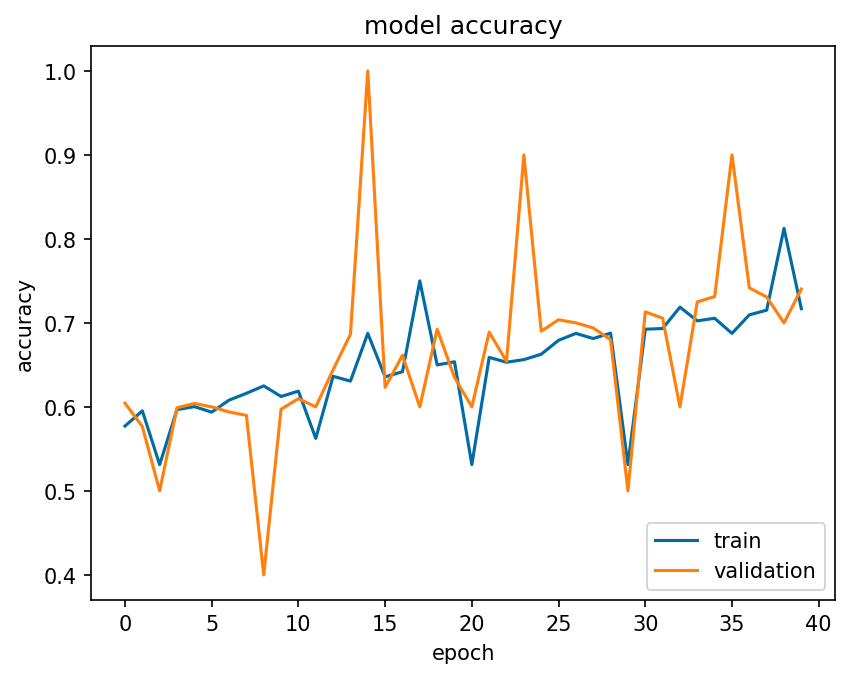

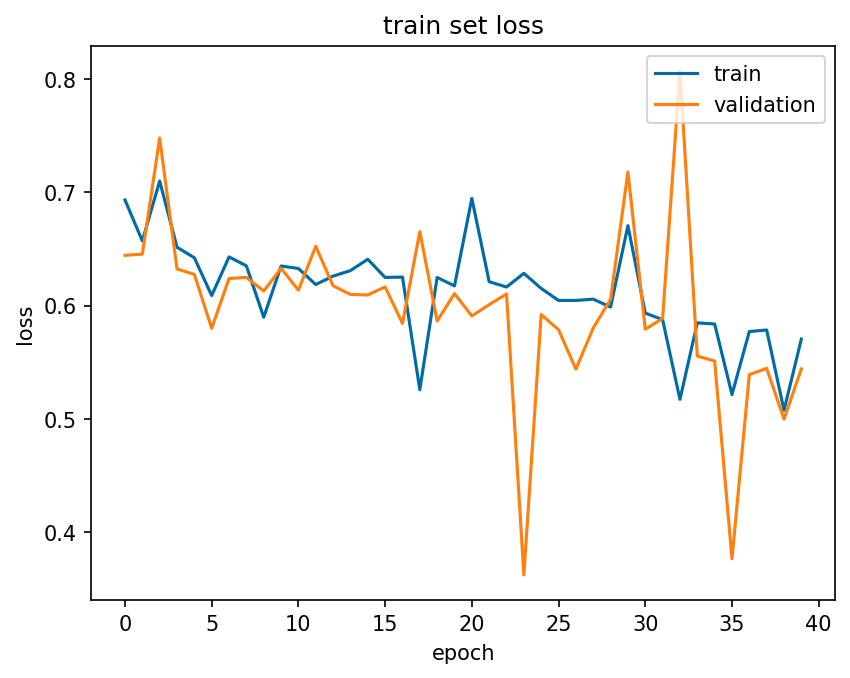

In [47]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('train set loss')

plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

## Let's PREDICT!!

In [48]:
# Ensure the generator is reset to start from the first image
# test_gen.reset()

# Use model.predict instead of predict_generator
# predY = model.predict(
#     test_gen,
#     steps=STEP_SIZE_TEST,
#     verbose=1
# )
# Reset the test generator to start from the beginning
test_gen.reset()

# List to store predictions
predictions = []

# Iterate through the test generator
for i in range(len(test_gen)):
    # Get the next batch (only one image since batch_size=1)
    img = next(test_gen)
    
    # Predict on the individual image
    pred = model.predict(img)
    
    # Store the prediction
    predictions.append(pred)

# Convert the list of predictions to an array if needed
predY = np.vstack(predictions)

# Get the true labels
testY = test_gen.classes


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━

## Confusion Matrix

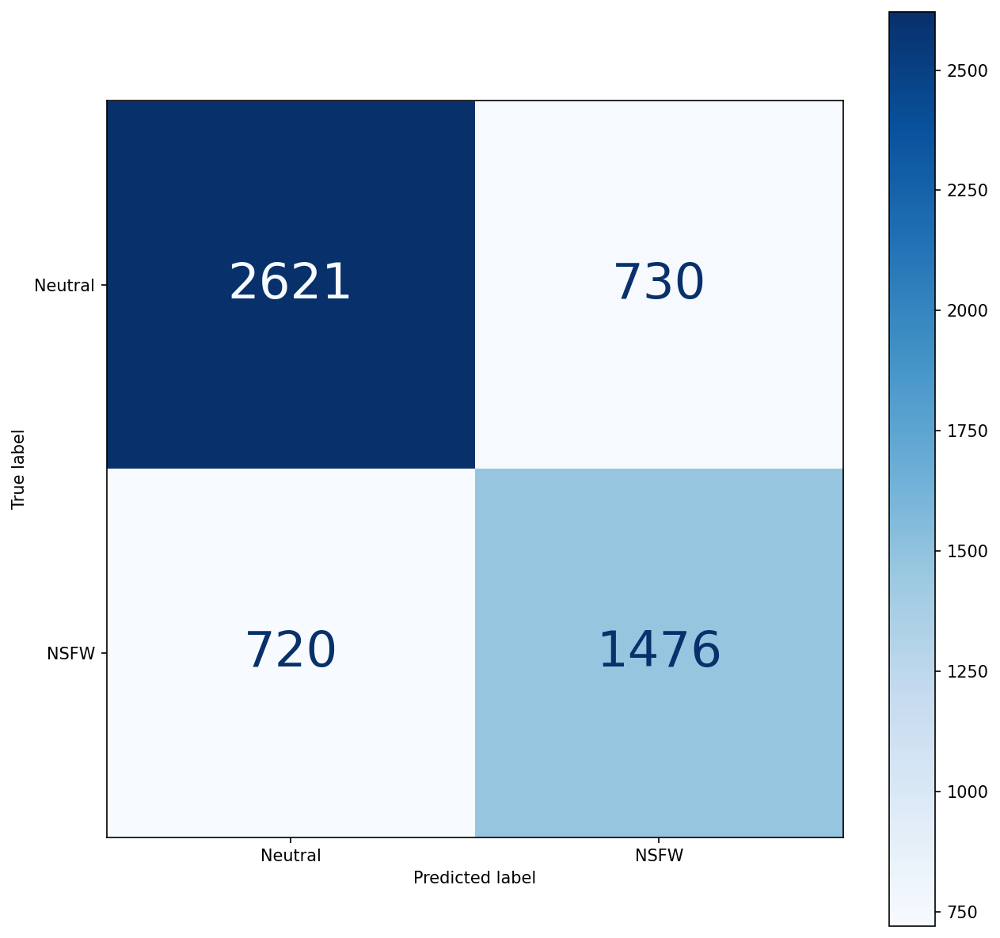

In [51]:
# Update the class_to_label_map to include only 'Neutral' and 'NSFW'
class_to_label_map = {'Neutral': 0, 'NSFW': 1}

# Calculate the confusion matrix and classification report
cm = confusion_matrix(testY, np.argmax(predY, axis=-1))  # confusion matrix
cr = classification_report(
    testY,
    np.argmax(predY, axis=-1),
    target_names=class_to_label_map.keys(),
    output_dict=True,
    digits=4
)

# Plot confusion matrix
labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10, 10))
disp.plot(cmap=plt.cm.Blues, ax=ax)
for label in disp.text_.ravel():
    label.set_fontsize(30)
plt.show()


## Save Model

In [55]:
# CCT.save("ViT_model")
model.save("ViT_model.keras")
np.save('history_ViT.npy',history.history)

## Classification report

<Axes: >

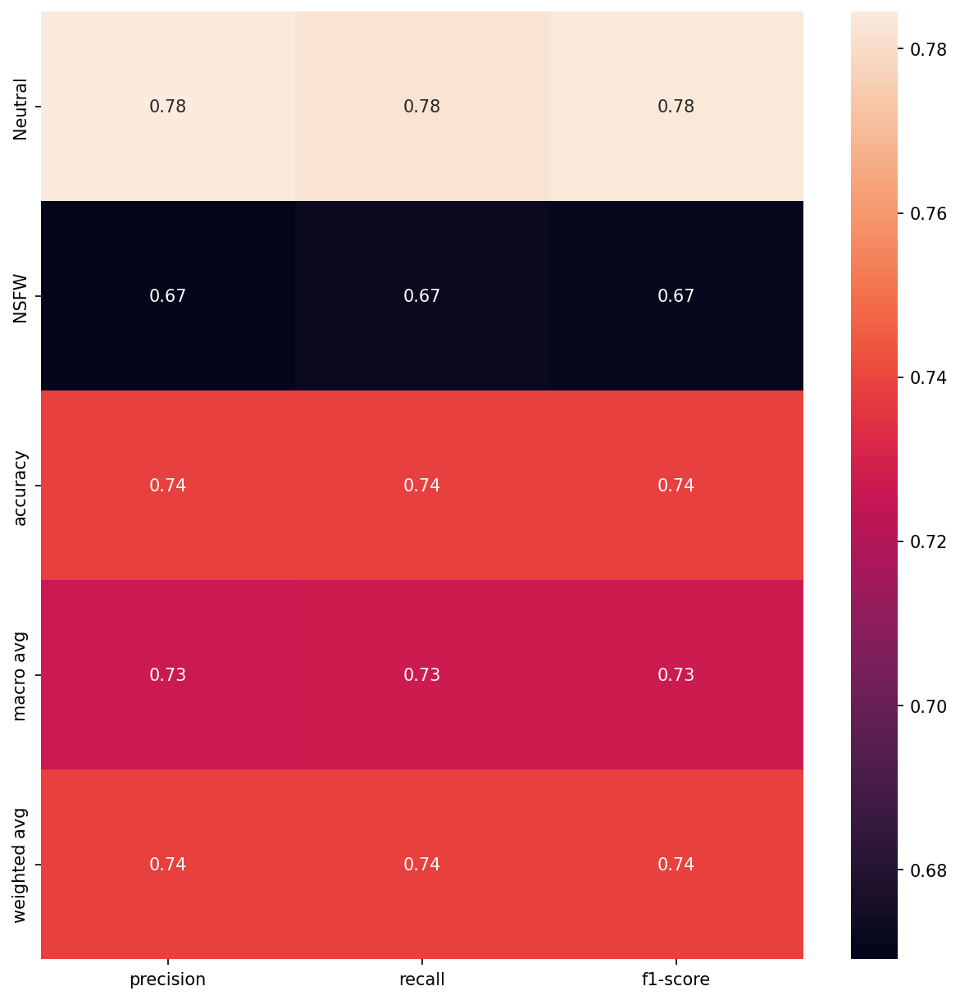

In [56]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(pd.DataFrame(cr).iloc[:-1, :].T, annot=True, ax=ax)

## Results

In [57]:
y_val = test_gen.classes
# y_pred = model.predict(test_gen)
confidence = np.max(predY,axis=1)
y_pred = np.argmax(predY,axis=1)

In [58]:
print(classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.78      0.78      0.78      3351
           1       0.67      0.67      0.67      2196

    accuracy                           0.74      5547
   macro avg       0.73      0.73      0.73      5547
weighted avg       0.74      0.74      0.74      5547



In [59]:
class_indices = test_gen.class_indices
indices = {v:k for k,v in class_indices.items()}

In [60]:
filenames = test_gen.filenames

We get the confidence values here

In [61]:
result_df = pd.DataFrame()
result_df['filename'] = filenames
result_df['actual'] = y_val
result_df['predicted'] = y_pred
result_df['actual'] = result_df['actual'].apply(lambda x: indices[x])
result_df['predicted'] = result_df['predicted'].apply(lambda x: indices[x])
result_df.loc[result_df['actual']==result_df['predicted'],'Same'] = True
result_df.loc[result_df['actual']!=result_df['predicted'],'Same'] = False
result_df['confidence'] = confidence
result_df.head(10)

,filename,actual,predicted,Same,confidence
0,NSFW\00003-2732446396.png,NSFW,NSFW,True,0.768830
1,NSFW\00017-1310684720.png,NSFW,NSFW,True,0.505788
2,NSFW\00021-2909686487.png,NSFW,NSFW,True,0.517814
3,NSFW\00022-242155203.png,NSFW,Neutral,False,0.522391
4,NSFW\00028-479591031.png,NSFW,Neutral,False,0.503068
5,NSFW\00032-910005649.png,NSFW,Neutral,False,0.512977
6,NSFW\00036-985276262.png,NSFW,NSFW,True,0.506190
7,NSFW\00046-993935908.png,NSFW,Neutral,False,0.508671
8,NSFW\00048-993935910.png,NSFW,Neutral,False,0.516949
9,NSFW\00055-95206666.png,NSFW,Neutral,False,0.516429


In [62]:
result_df = result_df.sample(frac=1).reset_index(drop=True)

In [63]:
# from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img
# def readImage(path):
#     img = load_img(path,color_mode='rgb',target_size=(image_size,image_size))
#     img = img_to_array(img)
#     img = img/255.

#     return img

# def display_images(temp_df):
#     print(temp_df)
#     temp_df = temp_df.reset_index(drop=True)
#     plt.figure(figsize = (20 , 20))
#     n = 0
#     for i in range(15):
#         n+=1
#         plt.subplot(5 , 5, n)
#         plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
#         image = readImage(f"/kaggle/input/covid19-chest-xray-dataset/covid19-pneumonia-normal-chest-xraypa-dataset/COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/{temp_df.filename[i]}")
#         plt.imshow(image)
#         plt.title("Actual Class:" + str(temp_df.actual[i]) + "\n" + "Predicted Class:" + str(temp_df.predicted[i]) + "\n" + "Confidence:" + str(temp_df.confidence[i]))

In [64]:
# display_images(result_df[result_df['Same']==True])

Misclassified Inputs

In [65]:
# display_images(result_df[result_df['Same']!=True])

# **Model 2 -Compact Convoutional Transformer (CCT)**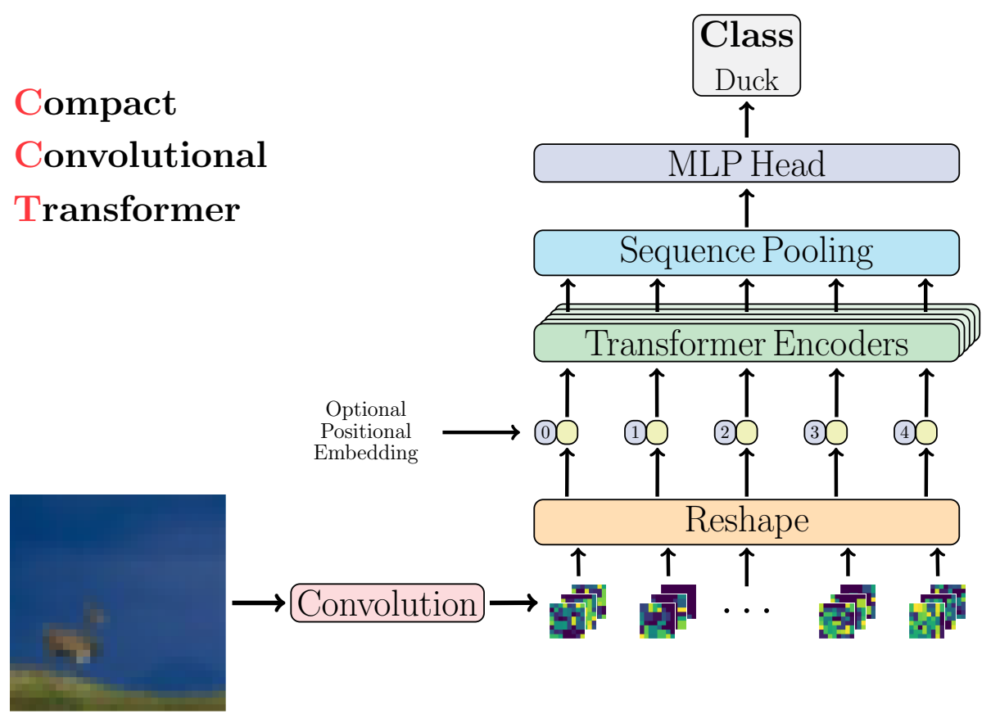

In [66]:
from tensorflow.keras import layers
from tensorflow import keras
class ConvolutionalTokenizer(layers.Layer):
    """
    Creates Convolutional Tokens of images for feeding to Transformer Encoder.
    """
    def __init__(self,kernel_size=3,stride=1,padding=1,pooling_kernel_size=3,pooling_stride=2,conv_layers=2,num_output_channels=[64, 128],**kwargs,):
        super(ConvolutionalTokenizer, self).__init__(**kwargs)

        # Creating a Sequential Keras Model for Tokenizing images
        self.conv_model = keras.Sequential()
        # Created the required number of convolutional layer
        for i in range(conv_layers):
            # Adding a conv2d layer with ReLU activation as suggested by authors
            self.conv_model.add(layers.Conv2D(num_output_channels[i],kernel_size,stride,padding="valid",use_bias=False,activation="relu",kernel_initializer="he_normal"))
            # Zero Padding
            self.conv_model.add(layers.ZeroPadding2D(padding))
            # Pooling over the image with 3x3 kernel having padding='same' and stride=2
            self.conv_model.add(layers.MaxPool2D(pooling_kernel_size, pooling_stride, "same"))

    def call(self, images):
        # Reshaping the outputs by flattening them
        outputs = self.conv_model(images)
        Flattened = tf.reshape(
            outputs,
            (-1, tf.shape(outputs)[1] * tf.shape(outputs)[2], tf.shape(outputs)[3]),
        )
        return Flattened

    # Adding Learnable Positional Embeddings
    def pos_embeddings(self, image_size):
        inp = tf.ones((1, image_size, image_size, 1))
        out = self.call(inp)
        seq_len = tf.shape(out)[1]
        projection_dim = tf.shape(out)[-1]

        embed_layer = layers.Embedding(
            input_dim=seq_len, output_dim=projection_dim
        )
        return embed_layer, seq_len

In [67]:
def mlp(x, hidden_units, dropout):
    """
    Creates A Feed Forward Network`

    Args:
        hidden_units: Number of hidden units in MLP
        dropout: The Rate of dropout which is to be applied.
    """
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout)(x)
    return x

In [68]:
def Transformer_Encoder(L,embedded_patches,num_heads,projection_dim,transformer_units):
    """
    Transformer Encoder Block

    Args:
        L: number of transformer_layers

        embedded_patches: Patches from the Convolutional Tokenizer block

        num_heads: Number of Attention Heads

        projection_dim: Size of each attention head for query and key

        transformer_units: hidden units of MLP
    """


    # Iterating over the number of transformer layers
    for i in range(L):
        # Normalizing the input patches
        norm = layers.LayerNormalization(epsilon=1e-5)(embedded_patches)
        # Feeding to MHA
        attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=projection_dim, dropout=0.1)(norm,norm)
        # Shortcut skip connection
        skip1 = layers.Add()([attention_output, embedded_patches])
        # Normalizing
        norm2= layers.LayerNormalization(epsilon=1e-5)(skip1)

        # Feed Forward MLP
        ffn = mlp(norm2, hidden_units=transformer_units, dropout=0.1)

        # Shortcut skip connection
        embedded_patches = layers.Add()([ffn, skip1])

        return embedded_patches

In [69]:
def SeqPool(trans_enco_out):
    """
    Sequence Pooling block.

    Args:
        trans_enco_out: Takes in the Output of transformer encoder block

    Returns:
        A 1xD output to be fed to final classifier
    """
    # Normalizing the output of transformer enocder layer
    normalized = layers.LayerNormalization(epsilon=1e-5)(trans_enco_out)
    # Adding a linear layer
    linear=layers.Dense(1)(normalized)
    # Applying Softmax to the linear layer
    soft = tf.nn.softmax(linear, axis=1)
    # Multiplying the softmax of linear layer with the normalized output of orignal output of the transformer encoder block
    mult = tf.matmul(soft, normalized, transpose_a=True)
    # Squeezing the dimensions
    seq_pool_output = tf.squeeze(mult, -2)

    return seq_pool_output

In [ ]:
def CompactConvolutionalTransformer(image_size=224,num_classes=2,input_shape=(224, 224, 1),projection_dim=128,num_heads=2,L=2,transformer_units=[128,128]):
    """
    CCT model

    Args:
        image_size: size of image

        num_classes: Number of classes of output

        input_shape: shape of image

        projection_dim: Size of each attention head for query and key

        num_heads: Number of heads of MHA

        L: Number of transformer encoder layers

    Returns:
        CCT Model
    """

    inputs = layers.Input(input_shape)
    """
    Convolutional Tokenization Block as shown in above image
    """
    # Encode patches.
    conv_tokenizer = ConvolutionalTokenizer()
    embedded_patches = conv_tokenizer(inputs)

    # Adding positional embedding.
    pos_embed, seq_length = conv_tokenizer.pos_embeddings(image_size)
    positions = tf.range(start=0, limit=seq_length, delta=1)
    position_embeddings = pos_embed(positions)
    embedded_patches += position_embeddings


    """
    Transformer with Sequence Pooling Block as shown in above image
    """

    # Feeding embedded patches after adding embeddings to transformer encoder block
    embedded_patches=Transformer_Encoder(L,embedded_patches,num_heads=num_heads,projection_dim=projection_dim,transformer_units=transformer_units)

    # Applying sequence pooling to output of the transformer encoder block
    sequence_pooling=SeqPool(embedded_patches)

    # Adding a dense layer for predictions
    output= layers.Dense(num_classes,activation='softmax')(sequence_pooling)

    model = keras.Model(inputs=inputs, outputs=output)
    return model

In [75]:
print(CompactConvolutionalTransformer().summary())

ValueError: Invalid dtype: <property object at 0x0000021AD184A980>

## **Training the Model**

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)

CCT = CompactConvolutionalTransformer()

CCT.compile(optimizer = optimizer,
              loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing = 0.1),
              metrics = [tf.keras.metrics.CategoricalAccuracy(name="accuracy"),
                         tf.keras.metrics.TopKCategoricalAccuracy(5, name="top-5-accuracy"),
                        ],
             )


STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

earlystopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                                 min_delta = 0,
                                                 patience = 15,
                                                 mode = 'auto',
                                                 verbose = 1)

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath = './CCTmodel.hdf5',
                                                  monitor = 'val_accuracy',
                                                  verbose = 1,
                                                  save_best_only = True,
                                                  save_weights_only = True,
                                                  mode = 'max')

decay_steps = train_gen.n // train_gen.batch_size
initial_learning_rate = learning_rate
lr_decayed_fn = tf.keras.experimental.CosineDecay(initial_learning_rate, decay_steps)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lr_decayed_fn)

callbacks = [earlystopping, lr_scheduler, checkpointer]

startTrain_CCT = time()
history = CCT.fit(x = train_gen,
          steps_per_epoch = STEP_SIZE_TRAIN,
          validation_data = valid_gen,
          validation_steps = STEP_SIZE_VALID,
          epochs = num_epochs,
          callbacks = callbacks)
time_passed_CCT = time()-startTrain_CCT

Epoch 1/150
91/91 [==============================] - ETA: 0s - loss: 1.1393 - accuracy: 0.3778 - top-5-accuracy: 1.0000
Epoch 1: val_accuracy improved from -inf to 0.44318, saving model to ./CCTmodel.hdf5
91/91 [==============================] - 139s 1s/step - loss: 1.1393 - accuracy: 0.3778 - top-5-accuracy: 1.0000 - val_loss: 1.0242 - val_accuracy: 0.4432 - val_top-5-accuracy: 1.0000 - lr: 0.0010
Epoch 2/150
91/91 [==============================] - ETA: 0s - loss: 0.9446 - accuracy: 0.5639 - top-5-accuracy: 1.0000
Epoch 2: val_accuracy improved from 0.44318 to 0.61790, saving model to ./CCTmodel.hdf5
91/91 [==============================] - 133s 1s/step - loss: 0.9446 - accuracy: 0.5639 - top-5-accuracy: 1.0000 - val_loss: 0.9140 - val_accuracy: 0.6179 - val_top-5-accuracy: 1.0000 - lr: 9.9970e-04
Epoch 3/150
91/91 [==============================] - ETA: 0s - loss: 0.8606 - accuracy: 0.6464 - top-5-accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.61790 to 0.67472, saving model 

## Running time & memory occupation(complexity) of the model

In [ ]:
print("Trainable parameters: ",model.count_params() )

print("Running time: ",t.strftime("%Hh%Mm%Ss", t.gmtime(time_passed_CCT)))

Trainable parameters:  305603
Running time:  03h03m59s


In [ ]:
test_gen.reset()
predY=CCT.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)
testY = test_gen.classes

915/915 [==============================] - 22s 24ms/step


## Confusion Matrix

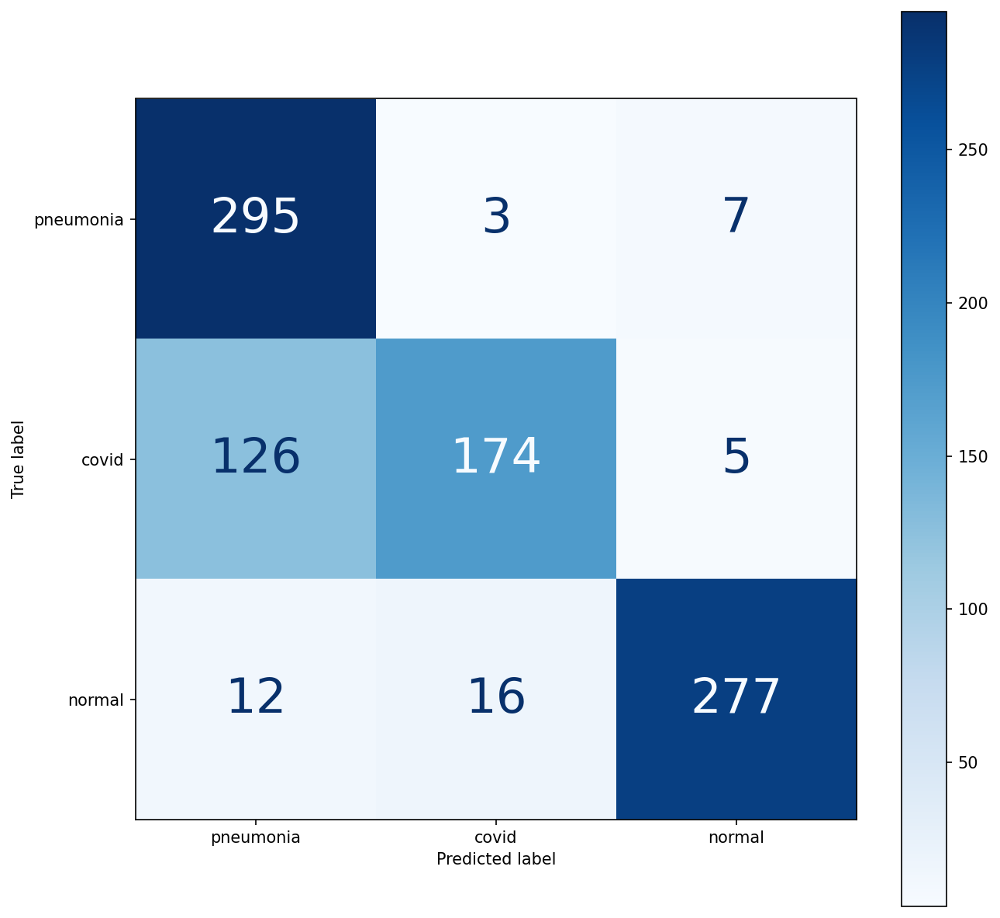

In [ ]:
cm = confusion_matrix(testY, np.argmax(predY, axis = -1)) # confusion matrix
cr=(classification_report(testY, np.argmax(predY, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.show()

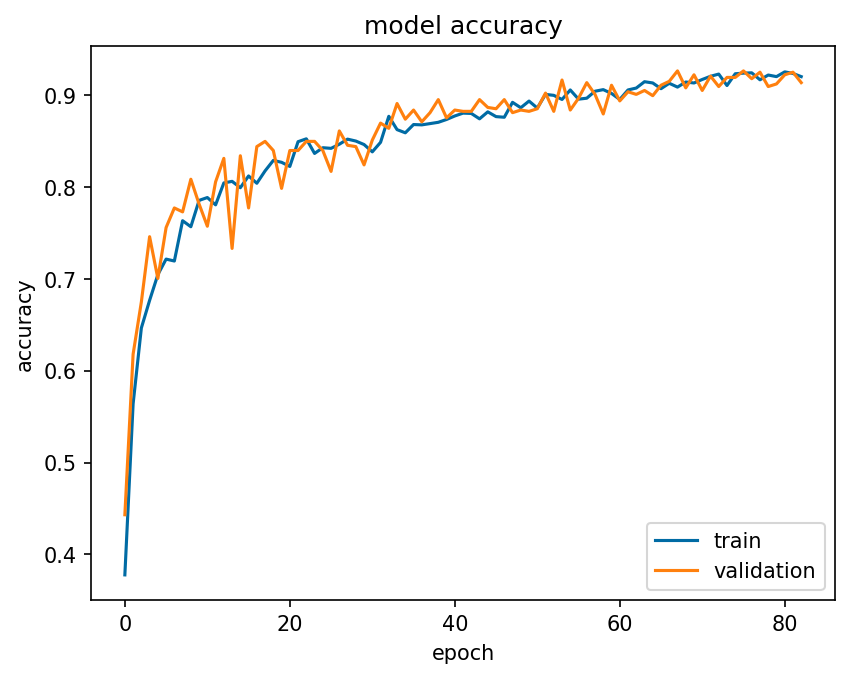

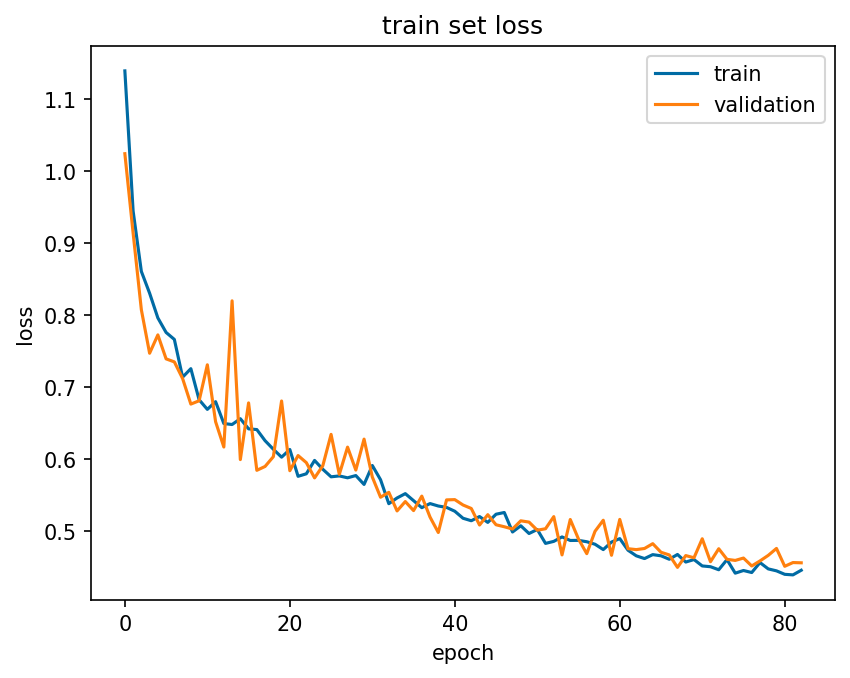

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('train set loss')

plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

## Save Model

In [ ]:
CCT.save("CCT_model")
np.save('history_CCT.npy',history.history)

# **Model 3 -Custom Sequential CNN**
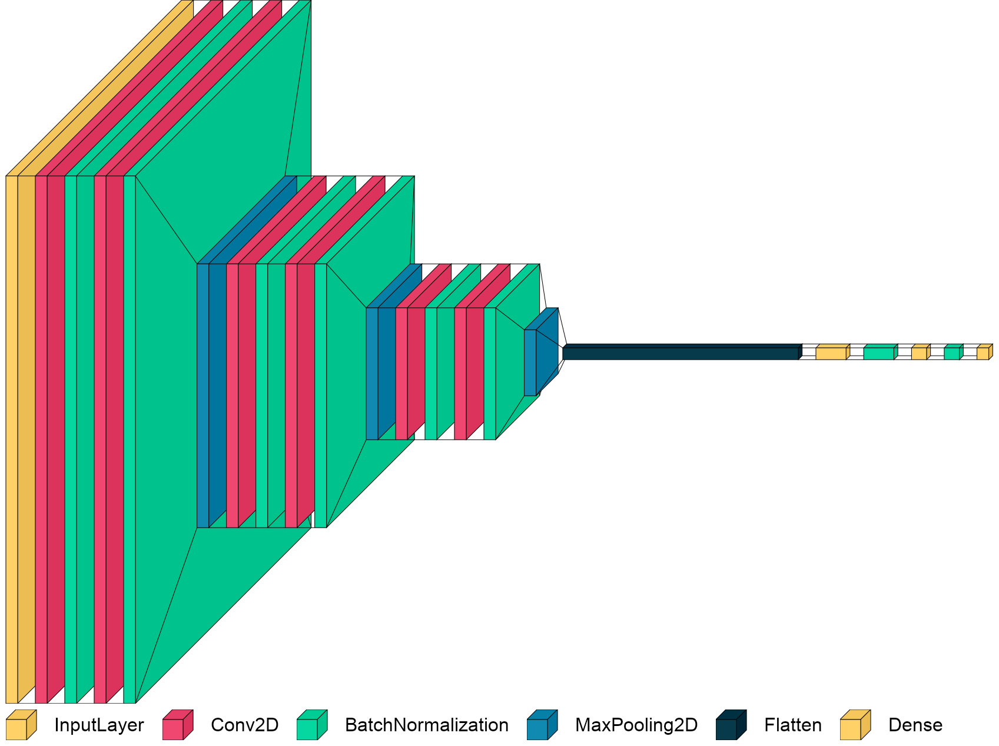

In [82]:
# Define the input layer
input_layer = tf.keras.layers.Input(shape=(224, 224, 1))

# Define the first convolutional layer
conv_layer_1 = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(input_layer)
conv_layer_1 = tf.keras.layers.BatchNormalization()(conv_layer_1)

# Define the second convolutional layer
conv_layer_2 = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(conv_layer_1)
conv_layer_2 = tf.keras.layers.BatchNormalization()(conv_layer_2)

# Define the first max pooling layer
pool_layer_1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_layer_2)

# Define the third convolutional layer
conv_layer_3 = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(pool_layer_1)
conv_layer_3 = tf.keras.layers.BatchNormalization()(conv_layer_3)

# Define the fourth convolutional layer
conv_layer_4 = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(conv_layer_3)
conv_layer_4 = tf.keras.layers.BatchNormalization()(conv_layer_4)

# Define the second max pooling layer
pool_layer_2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_layer_4)

# Define the fifth convolutional layer
conv_layer_5 = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(pool_layer_2)
conv_layer_5 = tf.keras.layers.BatchNormalization()(conv_layer_5)

# Define the sixth convolutional layer
conv_layer_6 = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(conv_layer_5)
conv_layer_6 = tf.keras.layers.BatchNormalization()(conv_layer_6)

# Define the third max pooling layer
pool_layer_3 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(conv_layer_6)

# Define the flatten layer
flatten_layer = tf.keras.layers.Flatten()(pool_layer_3)

# Define the first fully connected layer
fc_layer_1 = tf.keras.layers.Dense(256, activation='relu')(flatten_layer)
fc_layer_1 = tf.keras.layers.BatchNormalization()(fc_layer_1)

#Define the second fully connected layer
fc_layer_2 = tf.keras.layers.Dense(128, activation='relu')(fc_layer_1)
fc_layer_2 = tf.keras.layers.BatchNormalization()(fc_layer_2)

#Define the output layer
output_layer = tf.keras.layers.Dense(2, activation='softmax')(fc_layer_2)

#Create the model
CNN_seq = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

## **Training the Model**

In [88]:
# import tensorflow as tf
# print("Available GPUs:", tf.config.list_physical_devices('GPU'))


In [89]:
# import torch

# if torch.cuda.is_available():
#     print("GPU is available!")
#     print(f"Device name: {torch.cuda.get_device_name(0)}")
# else:
#     print("GPU is not available.")


In [90]:
optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)


CNN_seq.compile(optimizer = optimizer,
              loss = tf.keras.losses.BinaryCrossentropy(label_smoothing = 0.1),
              metrics = [tf.keras.metrics.CategoricalAccuracy(name="accuracy"),
                         tf.keras.metrics.TopKCategoricalAccuracy(5, name="top-5-accuracy"),
                        ],
             )


STEP_SIZE_TRAIN = int(0.1 * (train_gen.n // train_gen.batch_size))
STEP_SIZE_VALID = int(0.1 * (valid_gen.n // valid_gen.batch_size))
STEP_SIZE_TEST = int(0.1 * (test_gen.n // test_gen.batch_size))

earlystopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                                 min_delta = 0,
                                                 patience = 15,
                                                 mode = 'auto',
                                                 verbose = 1)

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath = './CNN_seq.weights.h5',
                                                  monitor = 'val_accuracy',
                                                  verbose = 1,
                                                  save_best_only = True,
                                                  save_weights_only = True,
                                                  mode = 'max')

decay_steps = train_gen.n // train_gen.batch_size
initial_learning_rate = learning_rate
lr_decayed_fn = tf.keras.optimizers.schedules.CosineDecay(initial_learning_rate, decay_steps)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: float(lr_decayed_fn(epoch)))

callbacks = [earlystopping, lr_scheduler, checkpointer]

startTrain_seq = time()
history = CNN_seq.fit(x = train_gen,
          steps_per_epoch = STEP_SIZE_TRAIN,
          validation_data = valid_gen,
          validation_steps = STEP_SIZE_VALID,
          epochs = num_epochs,
          callbacks = callbacks)
time_passed_CCN_seq = time()-startTrain_seq

Epoch 1/40
103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.5748 - loss: 0.7063 - top-5-accuracy: 1.0000
Epoch 1: val_accuracy improved from -inf to 0.57904, saving model to ./CNN_seq.weights.h5
103/103 ━━━━━━━━━━━━━━━━━━━━ 618s 6s/step - accuracy: 0.5751 - loss: 0.7060 - top-5-accuracy: 1.0000 - val_accuracy: 0.5790 - val_loss: 0.7779 - val_top-5-accuracy: 1.0000 - learning_rate: 0.0010
Epoch 2/40
103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6736 - loss: 0.6058 - top-5-accuracy: 1.0000
Epoch 2: val_accuracy did not improve from 0.57904
103/103 ━━━━━━━━━━━━━━━━━━━━ 578s 6s/step - accuracy: 0.6736 - loss: 0.6058 - top-5-accuracy: 1.0000 - val_accuracy: 0.5331 - val_loss: 0.7857 - val_top-5-accuracy: 1.0000 - learning_rate: 1.0000e-03
Epoch 3/40
103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.6795 - loss: 0.6312 - top-5-accuracy: 1.0000
Epoch 3: val_accuracy did not improve from 0.57904
103/103 ━━━━━━━━━━━━━━━━━━━━ 674s 7s/step - accuracy: 0.6794 - loss: 0.6311 - top-

## Running time & memory occupation(complexity) of the model

In [91]:
print("Trainable parameters: ",model.count_params() )

print("Running time: ",t.strftime("%Hh%Mm%Ss", t.gmtime(time_passed_CCN_seq)))

Trainable parameters:  305410
Running time:  05h33m10s


In [ ]:
# Ensure the generator is reset to start from the first image
# test_gen.reset()

# Use model.predict instead of predict_generator
# predY = model.predict(
#     test_gen,
#     steps=STEP_SIZE_TEST,
#     verbose=1
# )
# Reset the test generator to start from the beginning
test_gen.reset()

# List to store predictions
predictions = []

# Iterate through the test generator
for i in range(len(test_gen)):
    # Get the next batch (only one image since batch_size=1)
    img = next(test_gen)
    
    # Predict on the individual image
    pred = model.predict(img)
    
    # Store the prediction
    predictions.append(pred)

# Convert the list of predictions to an array if needed
predY = np.vstack(predictions)

# Get the true labels
testY = test_gen.classes


915/915 [==============================] - 15s 16ms/step


## Confusion Matrix

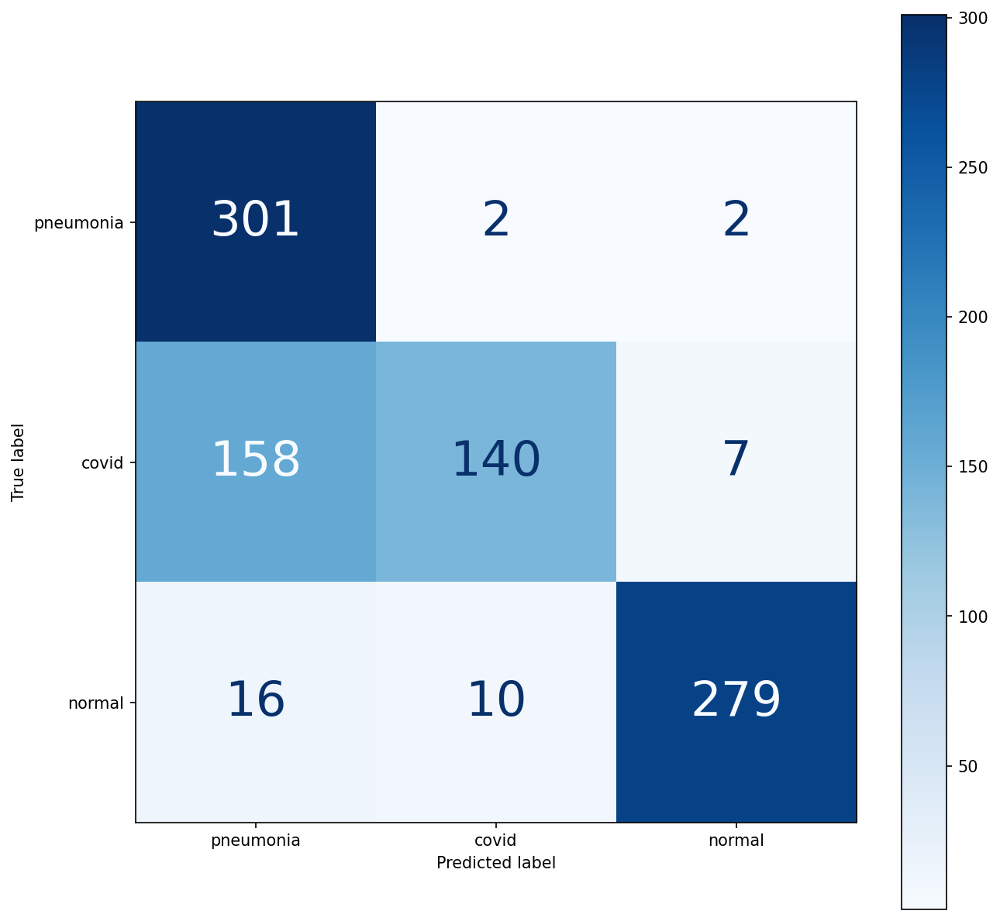

In [ ]:
cm = confusion_matrix(testY, np.argmax(predY, axis = -1)) # confusion matrix
cr=(classification_report(testY, np.argmax(predY, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.show()

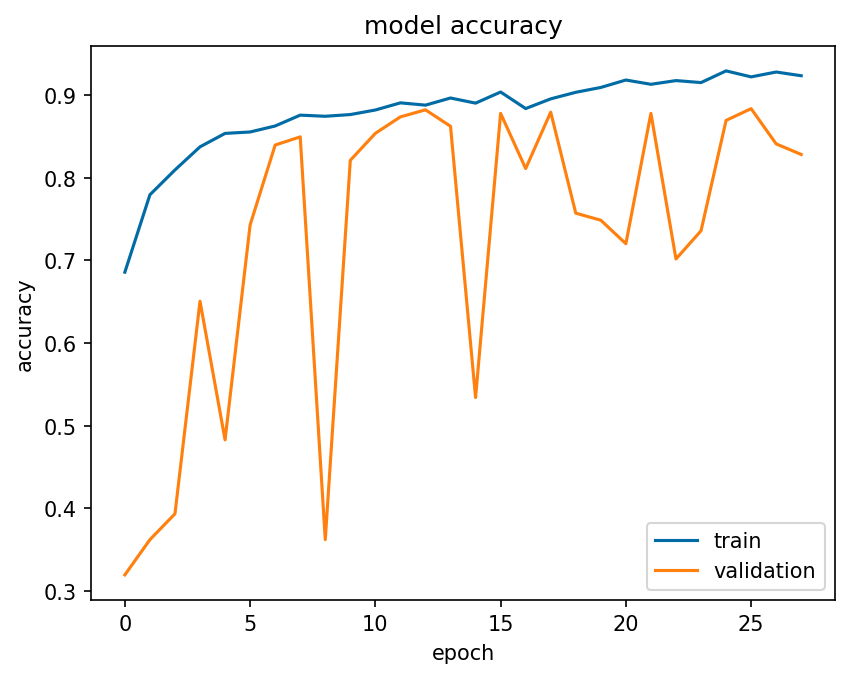

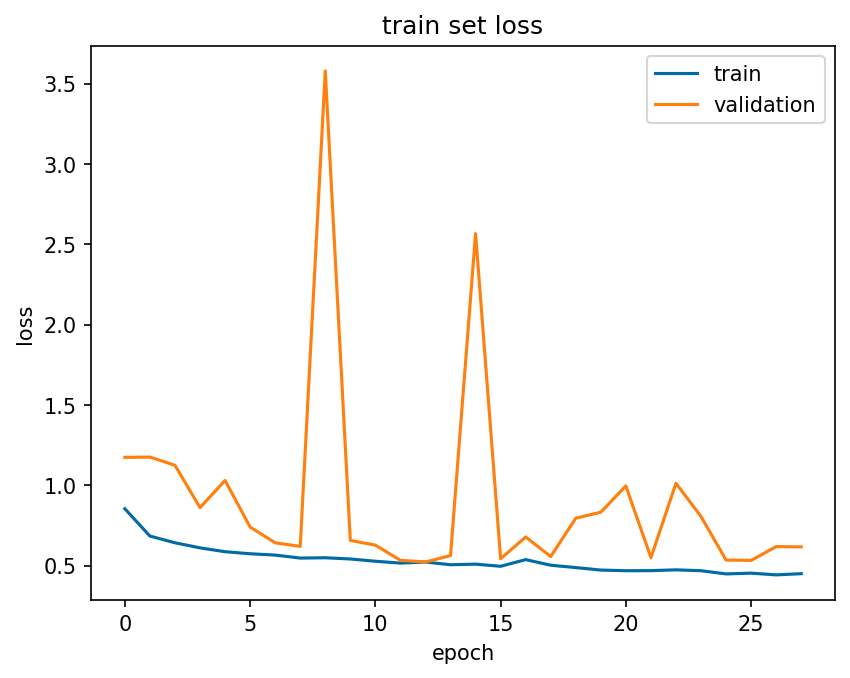

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('train set loss')

plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

## Save Model

In [ ]:
CNN_seq.save("CNN_seq")
np.save('history_CNN_seq.npy',history.history)

## Model Plot

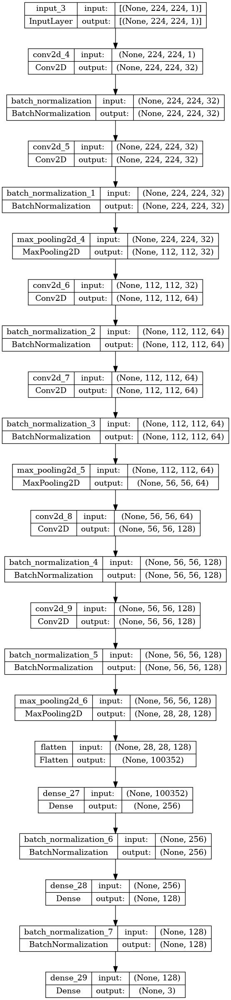

In [ ]:
tf.keras.utils.plot_model(CNN_seq, to_file='./CNN_seq.png', show_shapes=True, show_layer_names=True)

# **Model 4 -Custom Attention-Based CNN**
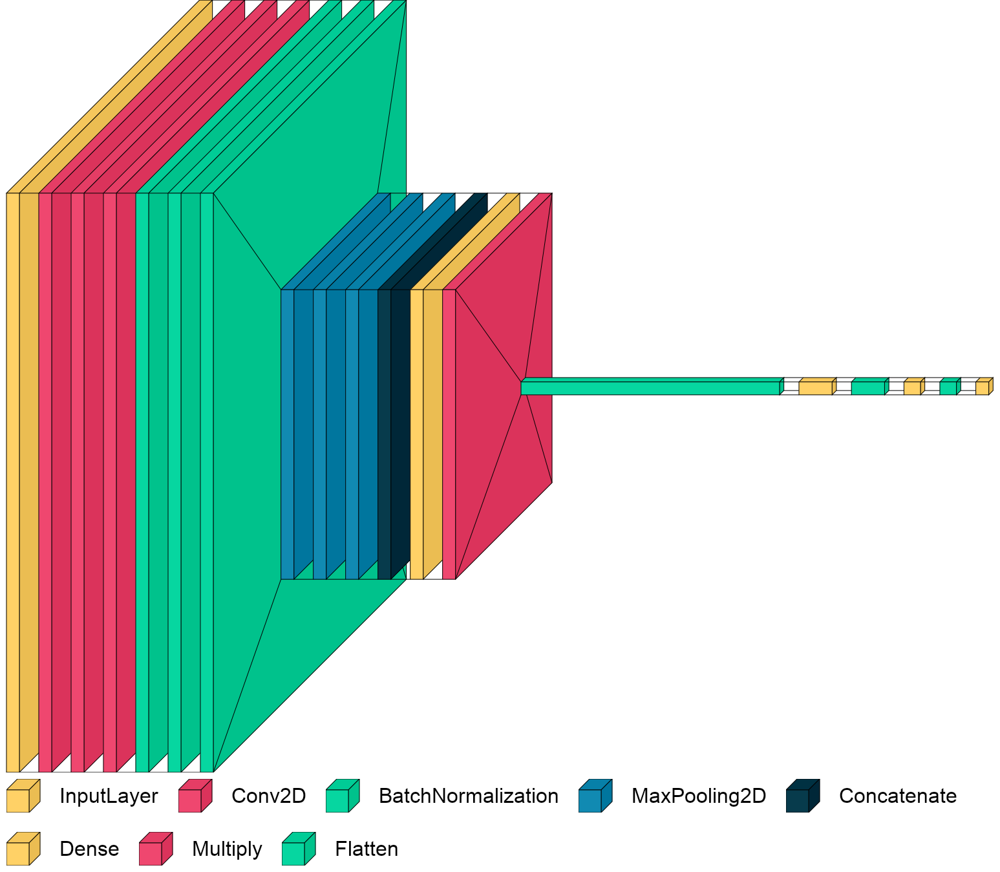

In [ ]:
# # # Define the input layer
# # input_layer = tf.keras.layers.Input(shape=(224, 224, 3))

# # # Define the first parallel connection
# # parallel_1 = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(input_layer)
# # parallel_1 = tf.keras.layers.BatchNormalization()(parallel_1)
# # parallel_1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_1)

# # # Define the second parallel connection
# # parallel_2 = tf.keras.layers.Conv2D(32, (5, 5), padding='same', activation='relu')(input_layer)
# # parallel_2 = tf.keras.layers.BatchNormalization()(parallel_2)
# # parallel_2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_2)

# # # Define the third parallel connection
# # parallel_3 = tf.keras.layers.Conv2D(32, (7, 7), padding='same', activation='relu')(input_layer)
# # parallel_3 = tf.keras.layers.BatchNormalization()(parallel_3)
# # parallel_3 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_3)

# # # Concatenate the outputs of the parallel connections
# # concatenated = tf.keras.layers.concatenate([parallel_1, parallel_2, parallel_3])

# # # Define the attention mechanism
# # attention_weights = tf.keras.layers.Dense(1, activation='softmax')(concatenated)
# # attention_output = tf.keras.layers.multiply([concatenated, attention_weights])

# # # Define the flatten layer
# # flatten_layer = tf.keras.layers.Flatten()(attention_output)

# # # Define the first fully connected layer
# # fc_layer_1 = tf.keras.layers.Dense(512, activation='relu')(flatten_layer)
# # fc_layer_1 = tf.keras.layers.BatchNormalization()(fc_layer_1)

# # # Define the second fully connected layer
# # fc_layer_2 = tf.keras.layers.Dense(256, activation='relu')(fc_layer_1)
# # fc_layer_2 = tf.keras.layers.BatchNormalization()(fc_layer_2)

# # # Define the output layer
# # output_layer = tf.keras.layers.Dense(3, activation='softmax')(fc_layer_2)

# # # Create the model
# # model_att = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# #-------------------------------------------------------------------------------------

# # Define the input layer
# input_layer = tf.keras.layers.Input(shape=(224, 224, 3))

# # Define the first parallel connection
# parallel_1 = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(input_layer)
# parallel_1 = tf.keras.layers.BatchNormalization()(parallel_1)
# parallel_1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_1)

# # Define the second parallel connection
# parallel_2 = tf.keras.layers.Conv2D(32, (5, 5), padding='same', activation='relu')(input_layer)
# parallel_2 = tf.keras.layers.BatchNormalization()(parallel_2)
# parallel_2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_2)

# # Define the third parallel connection
# parallel_3 = tf.keras.layers.Conv2D(32, (7, 7), padding='same', activation='relu')(input_layer)
# parallel_3 = tf.keras.layers.BatchNormalization()(parallel_3)
# parallel_3 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_3)

# # Concatenate the outputs of the parallel connections
# concatenated = tf.keras.layers.concatenate([parallel_1, parallel_2, parallel_3])

# # Define the attention mechanism
# attention_weights = tf.keras.layers.Dense(1, activation='softmax')(concatenated)
# attention_output = tf.keras.layers.multiply([concatenated, attention_weights])

# # Define the flatten layer
# flatten_layer = tf.keras.layers.Flatten()(attention_output)

# # Define the first fully connected layer
# fc_layer_1 = tf.keras.layers.Dense(256, activation='relu')(flatten_layer)
# fc_layer_1 = tf.keras.layers.BatchNormalization()(fc_layer_1)

# # Define the second fully connected layer
# fc_layer_2 = tf.keras.layers.Dense(128, activation='relu')(fc_layer_1)
# fc_layer_2 = tf.keras.layers.BatchNormalization()(fc_layer_2)

# # Define the output layer
# output_layer = tf.keras.layers.Dense(3, activation='softmax')(fc_layer_2)

# # Create the model
# model_att = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

In [4]:
# Define the input layer
input_layer = tf.keras.layers.Input(shape=(224, 224, 3))

# Define the first parallel connection
parallel_1 = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(input_layer)
parallel_1 = tf.keras.layers.BatchNormalization()(parallel_1)  # Disable fused batch norm
parallel_1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_1)

# Define the second parallel connection
parallel_2 = tf.keras.layers.Conv2D(32, (5, 5), padding='same', activation='relu')(input_layer)
parallel_2 = tf.keras.layers.BatchNormalization()(parallel_2)  # Disable fused batch norm
parallel_2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_2)

# Define the third parallel connection
parallel_3 = tf.keras.layers.Conv2D(32, (7, 7), padding='same', activation='relu')(input_layer)
parallel_3 = tf.keras.layers.BatchNormalization()(parallel_3)  # Disable fused batch norm
parallel_3 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(parallel_3)

# Concatenate the outputs of the parallel connections
concatenated = tf.keras.layers.concatenate([parallel_1, parallel_2, parallel_3])

# Define the attention mechanism
attention_weights = tf.keras.layers.Dense(1, activation='softmax')(concatenated)
attention_output = tf.keras.layers.multiply([concatenated, attention_weights])

# Define the flatten layer
flatten_layer = tf.keras.layers.Flatten()(attention_output)

# Define the first fully connected layer
fc_layer_1 = tf.keras.layers.Dense(256, activation='relu')(flatten_layer)
fc_layer_1 = tf.keras.layers.BatchNormalization()(fc_layer_1)

# Define the second fully connected layer
fc_layer_2 = tf.keras.layers.Dense(128, activation='relu')(fc_layer_1)
fc_layer_2 = tf.keras.layers.BatchNormalization()(fc_layer_2)

# Define the output layer
output_layer = tf.keras.layers.Dense(2, activation='softmax')(fc_layer_2)

# Create the model
model_att = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

In [6]:
# Paths for train, validation, and test directories
train_path = r'out/train'
val_path = r'out/val'
test_path = r'out/test'

# Data augmentation for the training set
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    featurewise_center=True,
    featurewise_std_normalization=True,
    shear_range=0.25,
    zoom_range=0.2,
    rotation_range=15,
    brightness_range=[0.15, 1.15],
    width_shift_range=[-2, -1, 0, +1, +2],
    height_shift_range=[-1, 0, +1],
    fill_mode='reflect'
)

# Simple rescaling for the validation set (no augmentation)
val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

# Training generator
train_gen = train_datagen.flow_from_directory(
    directory=train_path,
    color_mode='rgb',
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=1
)

# Validation generator
valid_gen = val_datagen.flow_from_directory(
    directory=val_path,
    color_mode='rgb',
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=1
)

# Test generator remains the same
test_gen = test_datagen.flow_from_directory(
    directory=test_path,
    color_mode="rgb",
    batch_size=1,
    class_mode=None,
    shuffle=False,
    seed=1,
    target_size=(image_size, image_size)
)

# Calculate steps per epoch to use 50% of each dataset
num_train_images = int(0.5 * train_gen.samples)
num_val_images = int(0.5 * valid_gen.samples)
num_test_images = int(0.5 * len(test_gen.filenames))

train_steps = num_train_images // batch_size
val_steps = num_val_images // batch_size
test_steps = num_test_images


Found 16638 images belonging to 2 classes.
Found 5546 images belonging to 2 classes.
Found 5547 images belonging to 2 classes.


In [ ]:
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def check_image_channels(directory):
    for filename in os.listdir(directory):
        path = os.path.join(directory, filename)
        try:
            # Load image in RGB mode and check shape
            img = load_img(path)
            img_array = img_to_array(img)
            if img_array.shape[2] != 3:
                print(f"{filename} is not RGB. Shape: {img_array.shape}")
        except Exception as e:
            print(f"Error loading {filename}: {e}")

# Replace 'your_image_directory' with the actual path to your images
check_image_channels('/kaggle/input/covid19-chest-xray-dataset/covid19-pneumonia-normal-chest-xraypa-dataset/COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/pneumonia')

In [7]:
model_att.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 224, 224,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 224, 224,  │      2,432 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 224, 224,  │      4,736 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 224, 224,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 224, 224,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 224, 224,  │        128 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 112, 112,  │          0 │ max_pooling2d[0]… │
│ (Concatenate)       │ 96)               │            │ max_pooling2d_1[… │
│                     │                   │            │ max_pooling2d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 112, 112,  │         97 │ concatenate[0][0] │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 112, 112,  │          0 │ concatenate[0][0… │
│                     │ 96)               │            │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 1204224)   │          0 │ multiply[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 256)       │ 308,281,6… │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256)       │      1,024 │ dense_1[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 128)       │     32,896 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 308,324,835 (1.15 GB)

 Trainable params: 308,323,875 (1.15 GB)

 Non-trainable params: 960 (3.75 KB)

## **Training the Model**

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)


model_att.compile(optimizer = optimizer,
              loss = tf.keras.losses.BinaryCrossentropy(label_smoothing = 0.1),
              metrics = [tf.keras.metrics.CategoricalAccuracy(name="accuracy"),
                         tf.keras.metrics.TopKCategoricalAccuracy(5, name="top-5-accuracy"),
                        ],
             )


STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

earlystopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                                 min_delta = 0,
                                                 patience = 15,
                                                 mode = 'auto',
                                                 verbose = 1)

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath = './model_att.weights.h5',
                                                  monitor = 'val_accuracy',
                                                  verbose = 1,
                                                  save_best_only = True,
                                                  save_weights_only = True,
                                                  mode = 'max')

decay_steps = train_gen.n // train_gen.batch_size
initial_learning_rate = learning_rate
lr_decayed_fn = tf.keras.optimizers.schedules.CosineDecay(initial_learning_rate, decay_steps)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: float(lr_decayed_fn(epoch)))

callbacks = [earlystopping, lr_scheduler, checkpointer]

startTrain_att = time()
history = model_att.fit(x = train_gen,
          steps_per_epoch = STEP_SIZE_TRAIN,
          validation_data = valid_gen,
          validation_steps = STEP_SIZE_VALID,
          epochs = num_epochs,
          callbacks = callbacks)
time_passed_model_att = time()-startTrain_att

Epoch 1/40
134/519 ━━━━━━━━━━━━━━━━━━━━ 18:31:47 173s/step - accuracy: 0.6219 - loss: 0.7206 - top-5-accuracy: 1.0000

## Running time & memory occupation(complexity) of the model

In [ ]:
# print("Trainable parameters: ",CNN_parallel.count_params() )
print("Trainable parameters: ",model_att.count_params() )

print("Running time: ",t.strftime("%Hh%Mm%Ss", t.gmtime(time_passed_model_att)))

Trainable parameters:  308324964
Running time:  02h24m13s


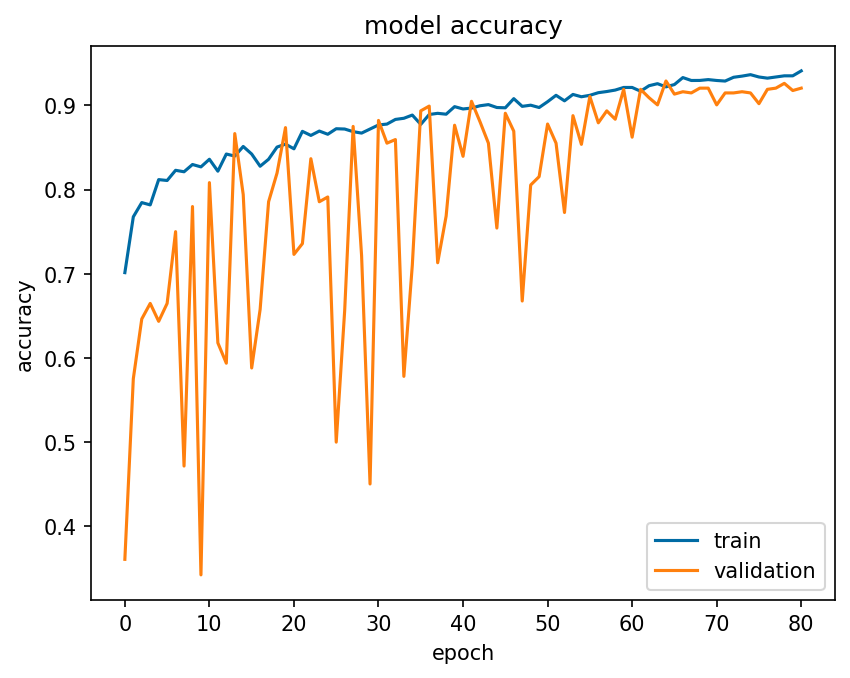

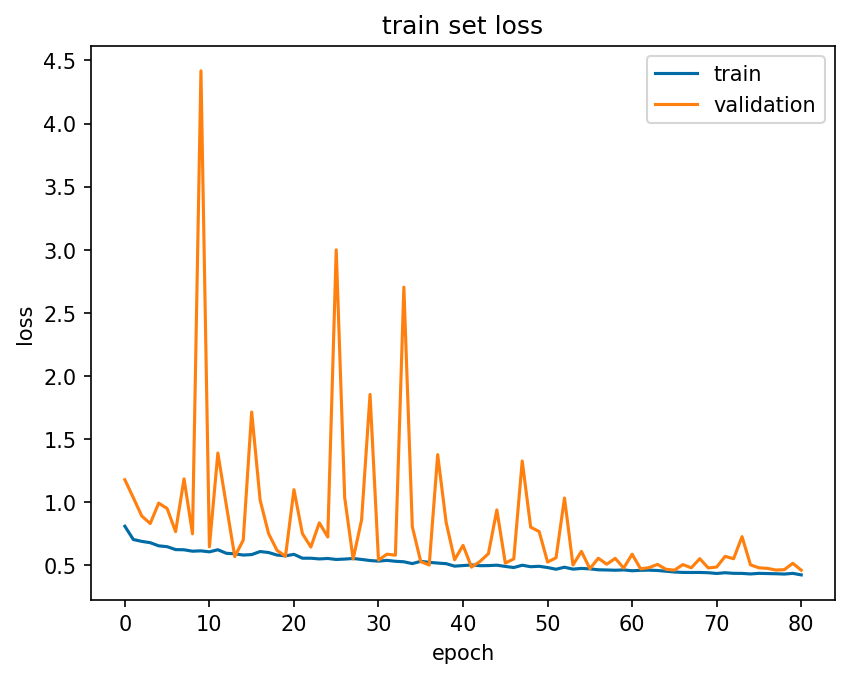

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('train set loss')

plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [ ]:
test_path = '/kaggle/working/out/test'
train_path = '/kaggle/working/out/train'

#Data augmentation methods are applied here!
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,
                                                            validation_split = 0.2,
                                                            featurewise_center = "True",
                                                            featurewise_std_normalization = "True",
                                                            shear_range = 0.25,
                                                            zoom_range = 0.2,
                                                            rotation_range = 15,
                                                            brightness_range = [0.15, 1.15],
                                                            width_shift_range = [-2,-1, 0, +1, +2],
                                                            height_shift_range = [ -1, 0, +1],
                                                            fill_mode = 'reflect')

#Different generator
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train_gen = datagen.flow_from_dataframe(dataframe = df_train,
                                        directory = train_path,
                                        x_col = 'directory',
                                        y_col = 'class',
                                        subset = 'training',
                                        batch_size = batch_size,
                                        seed = 1,
                                        color_mode = 'rgb',
                                        shuffle = True,
                                        class_mode = 'categorical',
                                        target_size = (image_size, image_size))

valid_gen = datagen.flow_from_dataframe(dataframe = df_train,
                                        directory = train_path,
                                        x_col = 'directory',
                                        y_col = 'class',
                                        subset = 'validation',
                                        batch_size = batch_size,
                                        seed = 1,
                                        color_mode = 'rgb',
                                        shuffle = True,
                                        class_mode = 'categorical',
                                        target_size = (image_size, image_size))


test_gen = test_datagen.flow_from_directory(
    directory=test_path,
    color_mode="rgb",
    batch_size=1,
    class_mode=None,
    shuffle=False,
    seed=1,
    target_size = (image_size, image_size)
)

Found 2928 validated image filenames belonging to 3 classes.
Found 732 validated image filenames belonging to 3 classes.
Found 915 images belonging to 3 classes.


In [ ]:
test_gen.reset()
predY=model_att.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)
testY = test_gen.classes

915/915 [==============================] - 20s 22ms/step


## Confusion Matrix

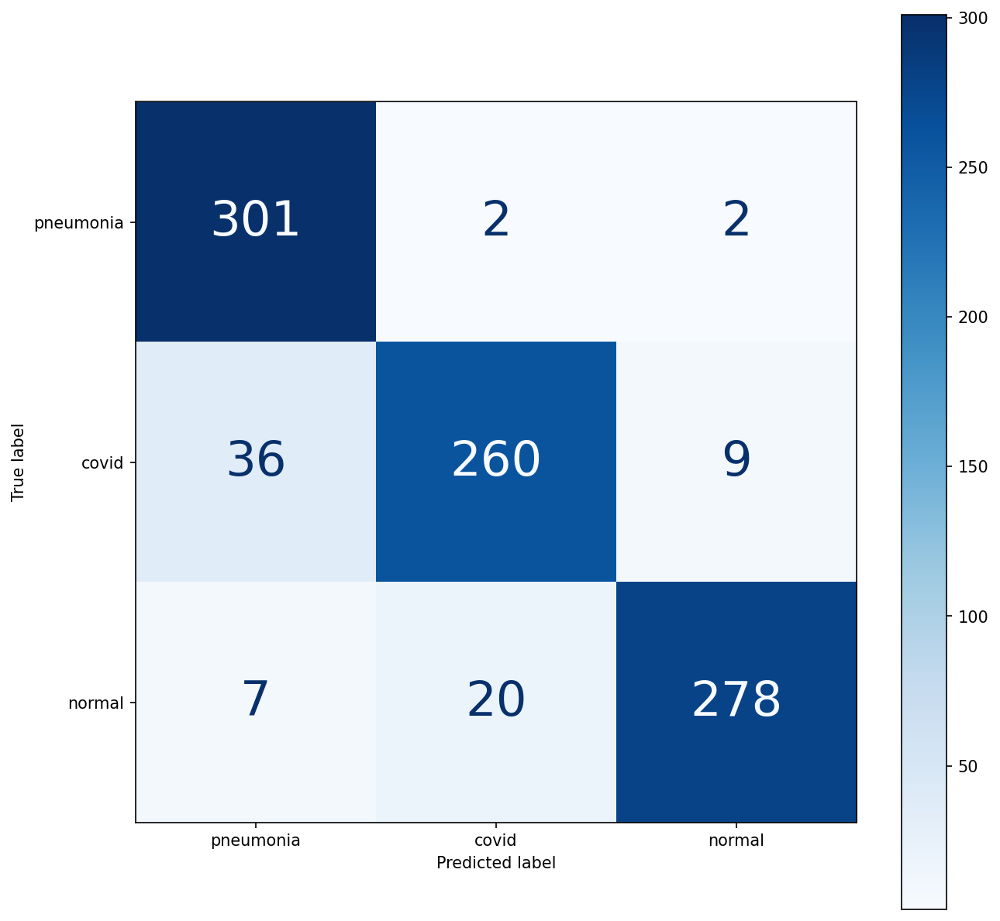

In [ ]:
cm = confusion_matrix(testY, np.argmax(predY, axis = -1)) # confusion matrix
cr=(classification_report(testY, np.argmax(predY, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.show()

## Save Model

In [ ]:
model_att.save("CNN_attention")
np.save('history_CNN_attention.npy',history.history)

## Model Plot

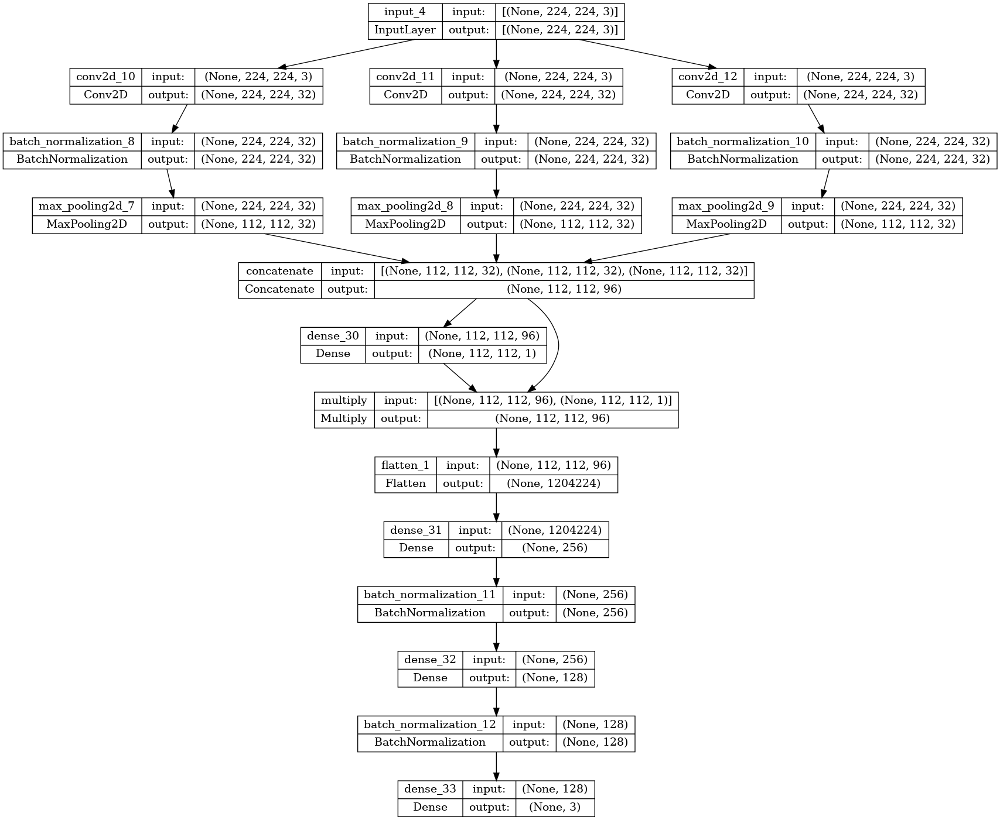

In [ ]:
tf.keras.utils.plot_model(model_att, to_file='./CNN_attention.png', show_shapes=True, show_layer_names=True)

# **Ensemble Modeling**

In [ ]:
ViT = tf.keras.models.load_model('/kaggle/working/ViT_model')
CCT = tf.keras.models.load_model('/kaggle/working/CCT_model')
CNN_Sequential = tf.keras.models.load_model('/kaggle/working/CNN_seq')
CNN_Attention = tf.keras.models.load_model('/kaggle/working/CNN_attention')

In [ ]:
from sklearn.ensemble import VotingClassifier

In [ ]:
# Ensemble of Models
estimator = []
estimator.append(('ViT',ViT))
estimator.append(('CTT', CCT))
estimator.append(('CNN_Sequential', CNN_Sequential))
estimator.append(('CNN_Attention', CNN_Attention))

In [ ]:
print(estimator)

[('ViT', <keras.saving.legacy.saved_model.load.VisionTransformer object at 0x7a015a083450>), ('CTT', <keras.engine.functional.Functional object at 0x79fd1db09810>), ('CNN_Sequential', <keras.engine.functional.Functional object at 0x79fd1f19f110>), ('CNN_Attention', <keras.engine.functional.Functional object at 0x79fd1f2ec6d0>)]


In [ ]:
STEP_SIZE_TRAIN = train_gen.n // train_gen.batch_size
STEP_SIZE_VALID = valid_gen.n // valid_gen.batch_size
STEP_SIZE_TEST = test_gen.n // test_gen.batch_size

In [ ]:
test_gen = test_datagen.flow_from_directory(
    directory=test_path,
    color_mode="grayscale",
    batch_size=1,
    class_mode=None,
    shuffle=False,
    seed=1,
    target_size = (image_size, image_size)
)

Found 915 images belonging to 3 classes.


In [ ]:
test_gen.reset()
pred_ViT=ViT.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)
testY = test_gen.classes


915/915 [==============================] - 26s 28ms/step


In [ ]:
test_gen.reset()
pred_CCT=CCT.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)

915/915 [==============================] - 24s 24ms/step


In [ ]:
test_gen.reset()
pred_CNN_Sequential=CNN_Sequential.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)

915/915 [==============================] - 16s 17ms/step


In [ ]:
test_gen = test_datagen.flow_from_directory(
    directory=test_path,
    color_mode="rgb",
    batch_size=1,
    class_mode=None,
    shuffle=False,
    seed=1,
    target_size = (image_size, image_size)
)

Found 915 images belonging to 3 classes.


In [ ]:
test_gen.reset()
pred_CNN_Attention=CNN_Attention.predict_generator(
        test_gen,
        steps=STEP_SIZE_TEST,
        verbose=1)

915/915 [==============================] - 20s 22ms/step


In [ ]:
stack=np.dstack((pred_ViT,pred_CCT,pred_CNN_Sequential,pred_CNN_Attention))
avg_ensemble_prob=np.mean(stack,axis=-1)
avg_ensemble_pred=np.argmax(avg_ensemble_prob,axis=-1)

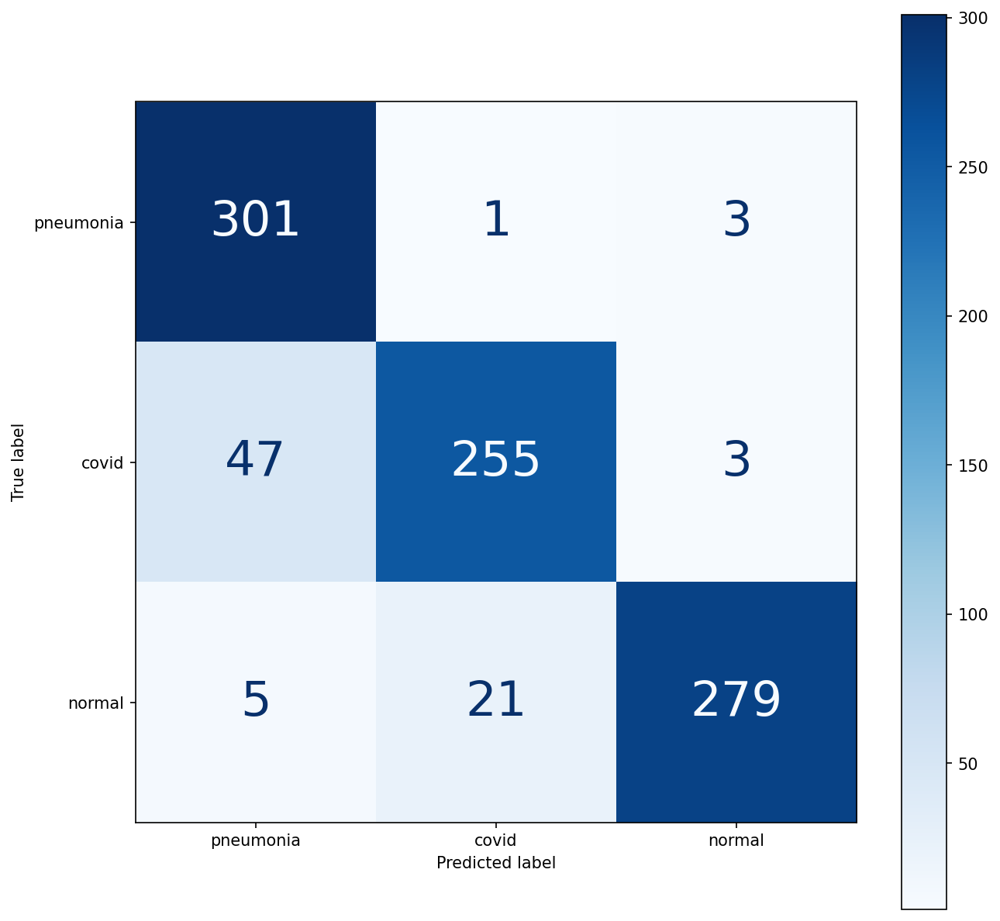

In [ ]:
cm = confusion_matrix(testY, avg_ensemble_pred) # confusion matrix
cr=(classification_report(testY, avg_ensemble_pred, target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

labels = class_to_label_map.keys()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(cmap=plt.cm.Blues,ax=ax)
for labels in disp.text_.ravel():
    labels.set_fontsize(30)
plt.savefig('ensemble_conf.png', dpi=1200)
plt.show()

<AxesSubplot:>

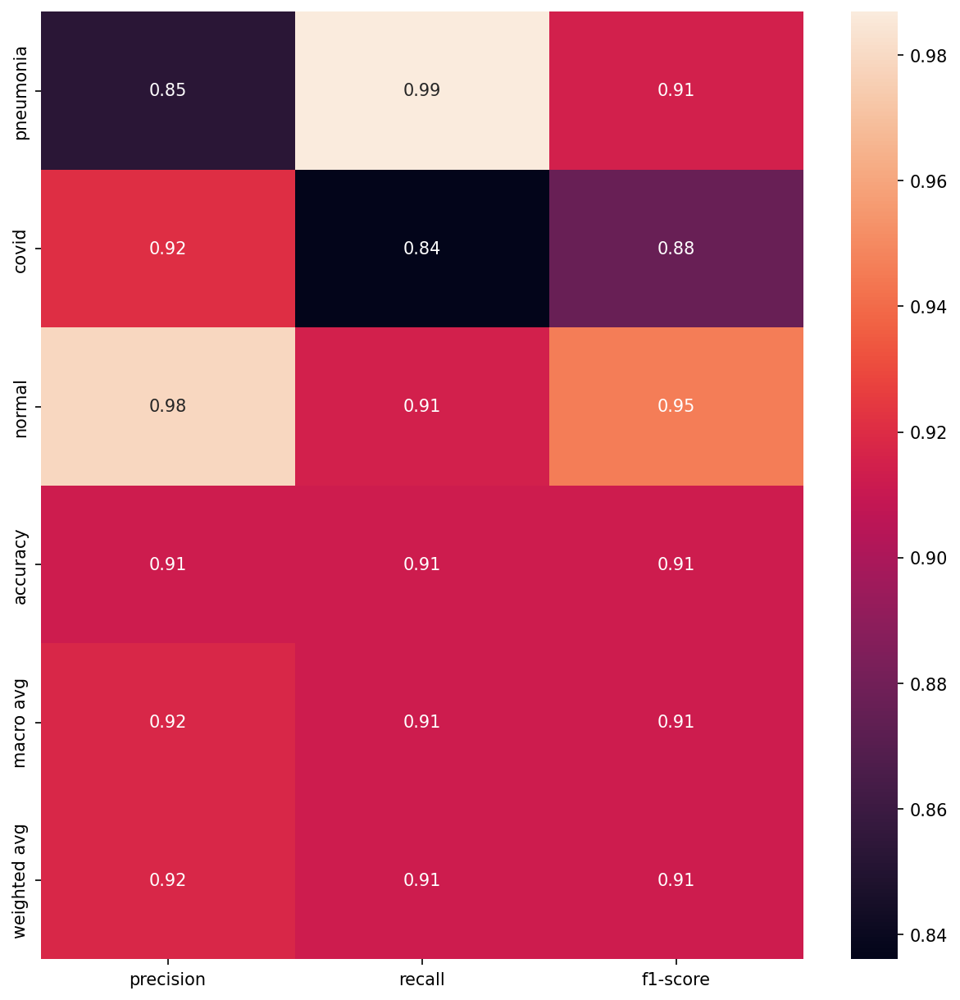

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(pd.DataFrame(cr).iloc[:-1, :].T, annot=True, ax=ax)

In [ ]:
cr1=(classification_report(testY, avg_ensemble_pred, target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr2=(classification_report(testY, np.argmax(pred_ViT, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr3=(classification_report(testY, np.argmax(pred_CCT, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr4=(classification_report(testY, np.argmax(pred_CNN_Sequential, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores
cr6=(classification_report(testY, np.argmax(pred_CNN_Attention, axis = -1), target_names=class_to_label_map, output_dict=True, digits=4)) #other scores

print("ViT Accuracy:" + str(cr2['accuracy']))
print("CCT Accuracy:" + str(cr3['accuracy']))
print("CNN_Sequential Accuracy:" + str(cr4['accuracy']))
print("CNN_Attention Accuracy:" + str(cr6['accuracy']))
print("Ensemble Accuracy:" + str(cr1['accuracy']))


ViT Accuracy:0.8765027322404372
CCT Accuracy:0.8153005464480875
CNN_Sequential Accuracy:0.7868852459016393
CNN_Attention Accuracy:0.9169398907103825
Ensemble Accuracy:0.912568306010929


# **Grad-Cam**

In [ ]:
y_val = test_gen.classes
y_pred = CNN_Attention.predict(test_gen)
confidence = np.max(y_pred,axis=1)
y_pred = np.argmax(y_pred,axis=1)
print(classification_report(y_val,y_pred))

915/915 [==============================] - 20s 22ms/step
              precision    recall  f1-score   support

           0       0.88      0.99      0.93       305
           1       0.92      0.85      0.89       305
           2       0.96      0.91      0.94       305

    accuracy                           0.92       915
   macro avg       0.92      0.92      0.92       915
weighted avg       0.92      0.92      0.92       915



In [ ]:
class_indices = test_gen.class_indices
indices = {v:k for k,v in class_indices.items()}

In [ ]:
filenames = test_gen.filenames

In [ ]:
result_df = pd.DataFrame()
result_df['filename'] = filenames
result_df['actual'] = y_val
result_df['predicted'] = y_pred
result_df['actual'] = result_df['actual'].apply(lambda x: indices[x])
result_df['predicted'] = result_df['predicted'].apply(lambda x: indices[x])
result_df.loc[result_df['actual']==result_df['predicted'],'Same'] = True
result_df.loc[result_df['actual']!=result_df['predicted'],'Same'] = False
result_df['confidence'] = confidence
result_df.head(10)

,filename,actual,predicted,Same,confidence
0,covid/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D-768...,covid,covid,True,0.981099
1,covid/353889E0-A1E8-4F9E-A0B8-F24F36BCFBFB-768...,covid,covid,True,0.997587
2,covid/7E335538-2F86-424E-A0AB-6397783A38D0-768...,covid,covid,True,0.910073
3,covid/B2D20576-00B7-4519-A415-72DE29C90C34-768...,covid,covid,True,0.733934
4,covid/COVID-19 (1).jpeg,covid,covid,True,0.987925
5,covid/COVID-19 (1).jpg,covid,covid,True,0.825390
6,covid/COVID-19 (103).jpg,covid,covid,True,0.900918
7,covid/COVID-19 (105).jpg,covid,covid,True,0.962784
8,covid/COVID-19 (111).jpg,covid,covid,True,0.945807
9,covid/COVID-19 (114).jpg,covid,covid,True,0.793335


In [ ]:
result_df = result_df.sample(frac=1).reset_index(drop=True)

In [ ]:
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img
def readImage(path):
    img = load_img(path,color_mode='grayscale',target_size=(image_size,image_size))
    img = img_to_array(img)
    img = img/255.

    return img

def display_images(temp_df):
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(15):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        image = readImage(f"/kaggle/input/covid19-chest-xray-dataset/covid19-pneumonia-normal-chest-xraypa-dataset/COVID19_Pneumonia_Normal_Chest_Xray_PA_Dataset/{temp_df.filename[i]}")
        plt.imshow(image)
        plt.title("Actual Class:" + str(temp_df.actual[i]) + "\n" + "Predicted Class:" + str(temp_df.predicted[i]) + "\n" + "Confidence:" + str(temp_df.confidence[i]))

Correctly Classified Images

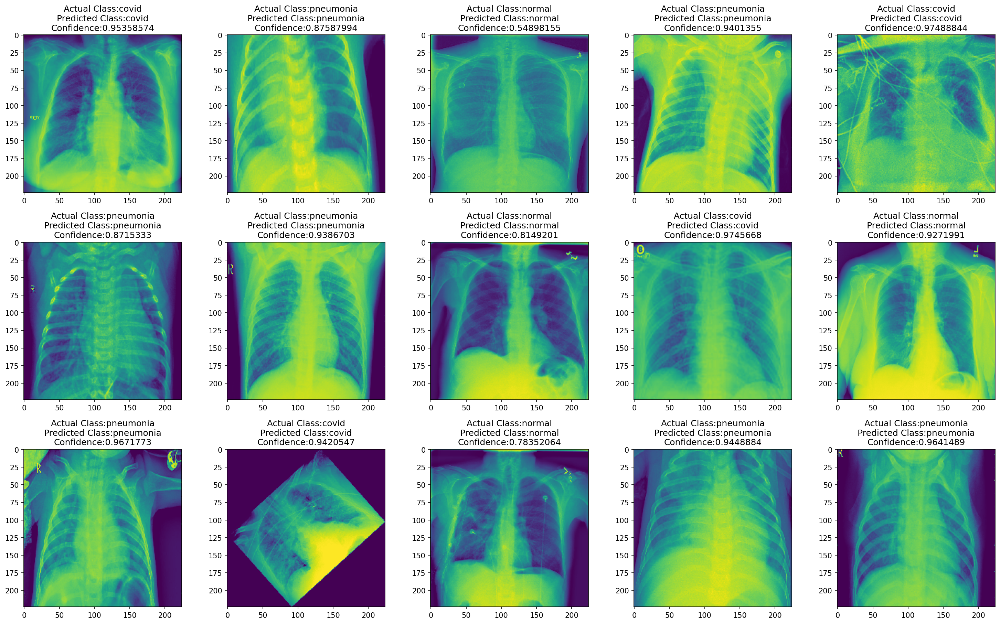

In [ ]:
display_images(result_df[result_df['Same']==True])
plt.tight_layout()
plt.savefig('confidence', dpi=1200)

Mislassified Images

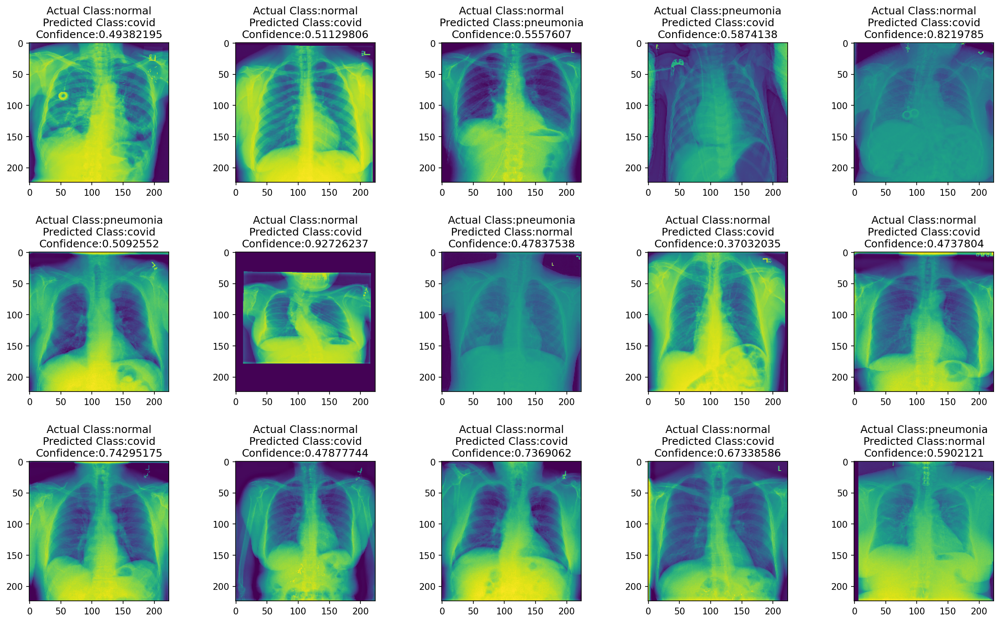

In [ ]:
display_images(result_df[result_df['Same']!=True])

In [ ]:
def make_gradcam_heatmap(img_array, model, pred_index=None):

    grad_model = Model(inputs=model.inputs, outputs=[model.layers[-9].output, model.output])

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy(), preds

In [ ]:
import matplotlib.cm as cm
from tensorflow.keras.models import Model
result_df

,filename,actual,predicted,Same,confidence
0,normal/00000308_000.png,normal,covid,False,0.493822
1,covid/COVID19(161).jpg,covid,covid,True,0.953586
2,pneumonia/person1677_bacteria_4443.jpeg,pneumonia,pneumonia,True,0.875880
3,normal/00000813_000.png,normal,normal,True,0.548982
4,pneumonia/person1496_bacteria_3909.jpeg,pneumonia,pneumonia,True,0.940135
...,...,...,...,...,...
910,covid/COVID-19 (568).jpg,covid,covid,True,0.881036
911,normal/00000023_003.png,normal,normal,True,0.967611
912,covid/COVID-19 (573).jpg,covid,covid,True,0.960626
913,pneumonia/person562_bacteria_2332.jpeg,pneumonia,pneumonia,True,0.883293


In [ ]:
def gradCAMImage(image):
    path = f"/kaggle/working/out/test/{image}"
    img = readImage(path)
    img = np.expand_dims(img,axis=0)
    heatmap,preds = make_gradcam_heatmap(img,CNN_Sequential)

    img = load_img(path)
    img = img_to_array(img)
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.8 + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    return superimposed_img

In [ ]:
def gradcam_of_images(correct_class):
    grad_images = []
    title = []
    temp_df = result_df[result_df['Same']==correct_class]
    temp_df = temp_df.reset_index(drop=True)
    for i in range(15):
        image = temp_df.filename[i]
        grad_image = gradCAMImage(image)
        grad_images.append(grad_image)
        title.append(f"A: {temp_df.actual[i]} P: {temp_df.predicted[i]}")

    return grad_images, title

In [ ]:
correctly_classified, c_titles = gradcam_of_images(correct_class=True)
misclassified, m_titles = gradcam_of_images(correct_class=False)

In [ ]:
def display_heatmaps(classified_images,titles,name):
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(15):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        plt.imshow(classified_images[i])
        plt.title(titles[i])
    #plt.tight_layout()
    #plt.savefig(name, dpi=1200)
    plt.show()

In [ ]:
display_heatmaps(correctly_classified,c_titles,'correctly_classified')


In [ ]:
display_heatmaps(misclassified,m_titles,'misclassified')

# PLOTS

In [ ]:
history_ViT=np.load('/kaggle/working/history_ViT.npy',allow_pickle='TRUE').item()
history_CCT=np.load('/kaggle/working/history_CCT.npy',allow_pickle='TRUE').item()
history_Seq=np.load('/kaggle/working/history_CNN_attention.npy',allow_pickle='TRUE').item()
history_Att=np.load('/kaggle/working/history_CNN_seq.npy',allow_pickle='TRUE').item()

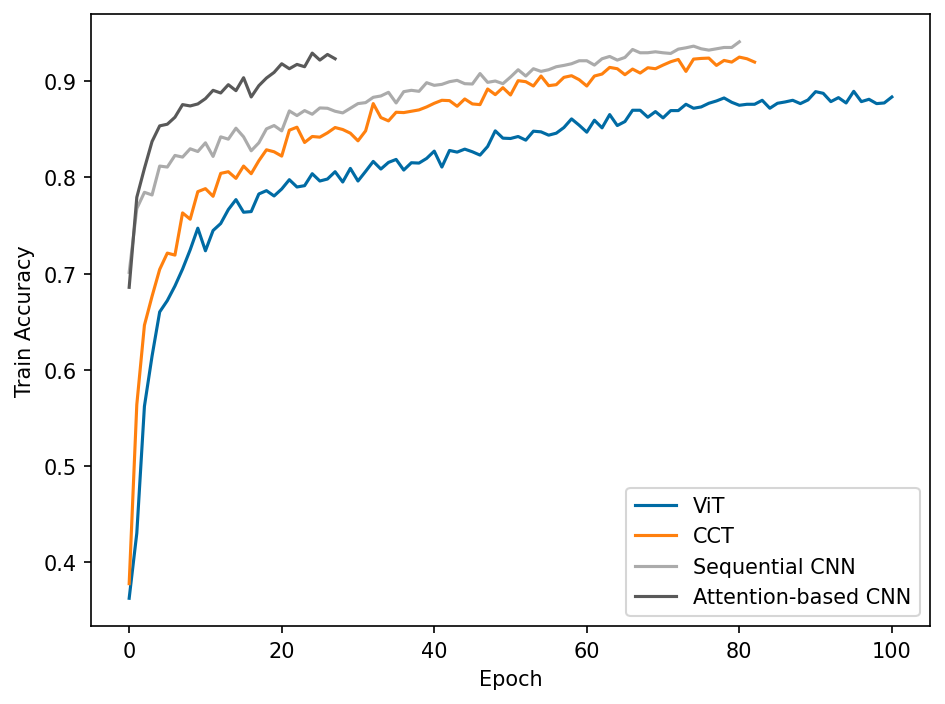

In [ ]:
plt.plot(history_ViT['accuracy'])
plt.plot(history_CCT['accuracy'])
plt.plot(history_Seq['accuracy'])
plt.plot(history_Att['accuracy'])
#plt.title('Train Accuracy')
plt.ylabel('Train Accuracy')
plt.xlabel('Epoch')
plt.legend(['ViT', 'CCT','Sequential CNN', 'Attention-based CNN'], loc='lower right')
plt.tight_layout()
plt.savefig('train_accuracy.png', dpi=1200)
plt.show()

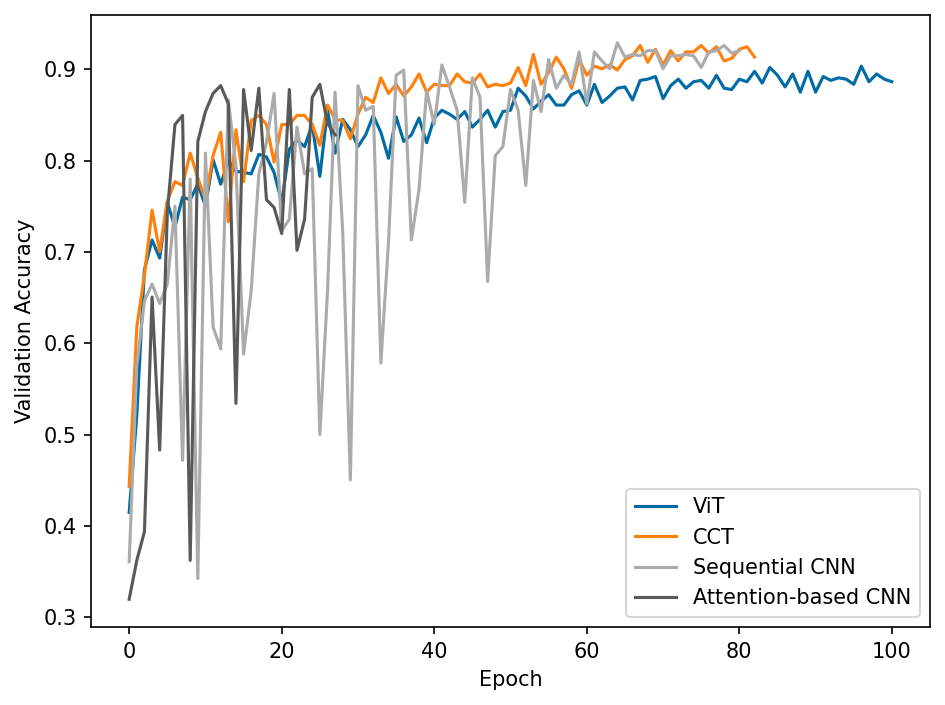

In [ ]:
plt.plot(history_ViT['val_accuracy'])
plt.plot(history_CCT['val_accuracy'])
plt.plot(history_Seq['val_accuracy'])
plt.plot(history_Att['val_accuracy'])
plt.ylabel('Validation Accuracy')
plt.xlabel('Epoch')
plt.legend(['ViT', 'CCT','Sequential CNN', 'Attention-based CNN'], loc='lower right')
plt.tight_layout()
plt.savefig('validation_accuracy.png', dpi=1200)
plt.show()

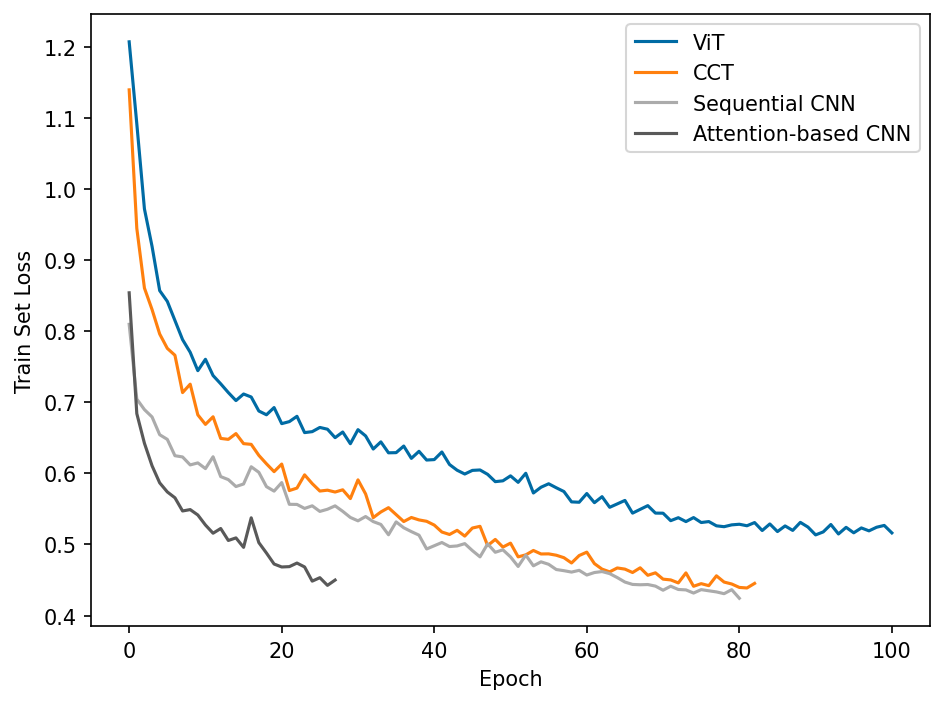

In [ ]:
plt.plot(history_ViT['loss'])
plt.plot(history_CCT['loss'])
plt.plot(history_Seq['loss'])
plt.plot(history_Att['loss'])
plt.ylabel('Train Set Loss')
plt.xlabel('Epoch')
plt.legend(['ViT', 'CCT','Sequential CNN', 'Attention-based CNN'], loc='upper right')
plt.tight_layout()
plt.savefig('train_loss.png', dpi=1200)
plt.show()

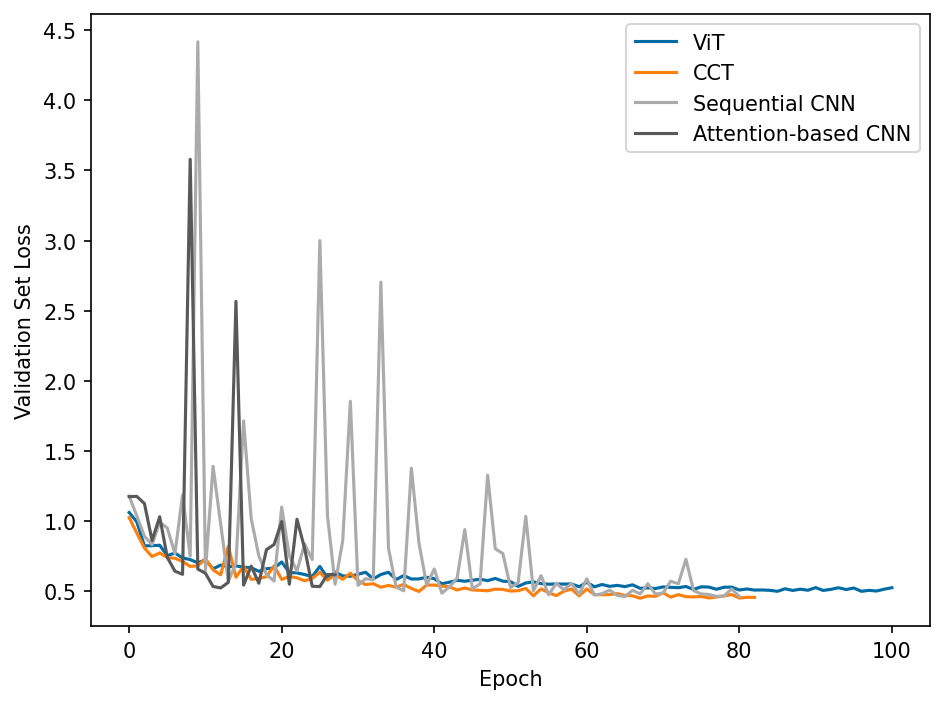

In [ ]:
plt.plot(history_ViT['val_loss'])
plt.plot(history_CCT['val_loss'])
plt.plot(history_Seq['val_loss'])
plt.plot(history_Att['val_loss'])
plt.ylabel('Validation Set Loss')
plt.xlabel('Epoch')
plt.legend(['ViT', 'CCT','Sequential CNN', 'Attention-based CNN'], loc='upper right')
plt.tight_layout()
plt.savefig('val_loss.png', dpi=1200)
plt.show()